In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from IPython import display
import torch
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import math
from torch.utils.data.dataloader import DataLoader
import repitl.kernel_utils as ku


from utils.colored_mnist_dataloader import ColoredMNISTDataset
from utils.visual_utils import display_mult_images, display_mult_figures
from utils.shuffled_pairs import find_pair

from trainer import mutiviewAE,mutiviewAEShuffled,mutiviewShared,multiviewExclusive,digit_classifier,test_classifier
from models import BigModel, BigOldModel,BigOld_Convolutional_Encoder,BigOld_Convolutional_Decoder
from sklearn import manifold

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')

1.0%

100.0%


Extracting ./data/coloredMNIST/MNIST/raw/train-images-idx3-ubyte.gz to ./data/coloredMNIST/MNIST/raw


100.0%


Extracting ./data/coloredMNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/coloredMNIST/MNIST/raw




100.0%
100.0%


Extracting ./data/coloredMNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/coloredMNIST/MNIST/raw

Extracting ./data/coloredMNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/coloredMNIST/MNIST/raw



## Learning the shared representation first

 DoE is 0.00000
epoch 0.0


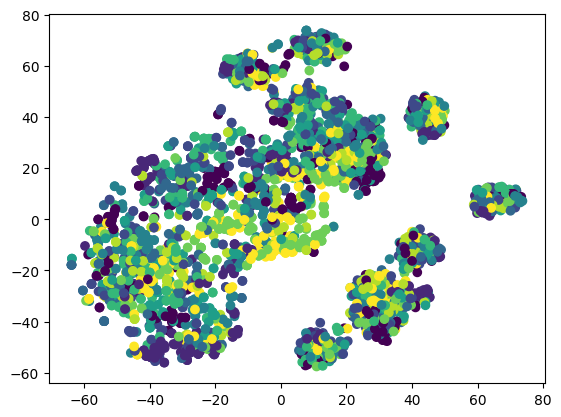

In [4]:
batch_size = 1500
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)
shared_dim = 10
n_epochs= 50



sharedEncoder = mutiviewShared(train_loader,
    shared_dim=shared_dim,
    batch_size = batch_size,
    n_epochs = n_epochs,
    print_every=30,
    plot_every = 150)

# PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewOnlyShared.pth'
# torch.save(sharedEncoder.state_dict(), PATH)

### Finding closest samples in the shared space

In [4]:
z_dim = 10
PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewOnlyShared.pth'
device = torch.device('cpu')
sharedEncoder = BigOld_Convolutional_Encoder(latent_dim = z_dim)
sharedEncoder.load_state_dict(torch.load(PATH, map_location = device))

<All keys matched successfully>

In [5]:
loader = DataLoader(train_dataset, batch_size=1000)
sample = next(iter(loader))
view1 = sample.bg
view2 = sample.fg
label1 = sample.digit_label
label2 = sample.digit_label
x = torch.cat((view1, view2), 0)
labels = torch.cat((label1,label2),0)
# x = x.to('cuda:1')
z = sharedEncoder(x)

In [ ]:
# tSNE visualization
tsne = manifold.TSNE()
z_2d = tsne.fit_transform(z.cpu().detach().numpy())
fig, ax = plt.subplots()

scatter = ax.scatter(z_2d[:,0],z_2d[:,1],c =labels)
ax.set_axis_off()

# produce a legend with the unique colors from the scatter
# legend1 = ax.legend(*scatter.legend_elements(),  title="Classes",  bbox_to_anchor=(1, 1))
path = './figures/' + 'tsneSharedRep.pdf'
fig.savefig(path, dpi=600,bbox_inches='tight')


In [22]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
z_l = z.detach().numpy()
nbrs = NearestNeighbors(n_neighbors=25, algorithm='ball_tree').fit(z_l)

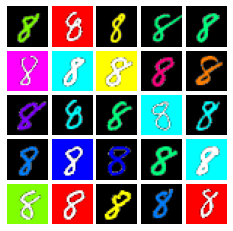

In [45]:
distances, indices = nbrs.kneighbors(z_l[1017,:].reshape(1, -1))
prototypes = x[indices[0,0:25],:].permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 5,5)

In [23]:
## Plots for paper
nbrs = NearestNeighbors(n_neighbors=4, algorithm='ball_tree').fit(z_l)

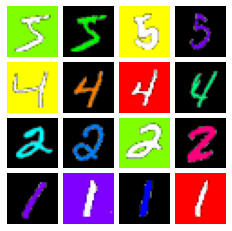

In [28]:
distances, indices = nbrs.kneighbors(z_l[0,:].reshape(1, -1))
prototypes = torch.zeros([16,3,28,28])
prototypes[:4,:] = x[indices[0,0:4],:]
distances, indices = nbrs.kneighbors(z_l[2,:].reshape(1, -1))
prototypes[4:8,:] = x[indices[0,0:4],:]
distances, indices = nbrs.kneighbors(z_l[1005,:].reshape(1, -1))
prototypes[8:12,:] = x[indices[0,0:4],:]
distances, indices = nbrs.kneighbors(z_l[1003,:].reshape(1, -1))
prototypes[12:,:] = x[indices[0,0:4],:]
prototypes = prototypes.permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 4,4, save_fig = True, name = 'nnShared.pdf')

## Learning the exclusive dimensions

Reconstruction error is 0.21274, divergence exclusive is 0.52258, mutual information is 0.00004
epoch 0.0


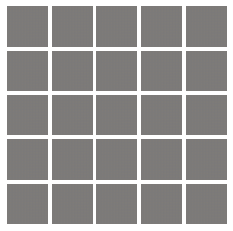

Reconstruction error is 0.09606, divergence exclusive is 0.01233, mutual information is 0.05361
Reconstruction error is 0.07891, divergence exclusive is 0.00679, mutual information is 0.04876
Reconstruction error is 0.04856, divergence exclusive is 0.00427, mutual information is 0.05256
Reconstruction error is 0.05248, divergence exclusive is 0.01203, mutual information is 0.05087
Reconstruction error is 0.04090, divergence exclusive is 0.01160, mutual information is 0.04694
epoch 1.0


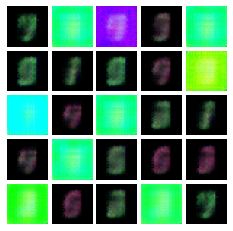

Reconstruction error is 0.04205, divergence exclusive is 0.00538, mutual information is 0.04375
Reconstruction error is 0.03725, divergence exclusive is 0.00926, mutual information is 0.03819
Reconstruction error is 0.04259, divergence exclusive is 0.00614, mutual information is 0.04600
Reconstruction error is 0.03743, divergence exclusive is 0.00491, mutual information is 0.04613
Reconstruction error is 0.03937, divergence exclusive is 0.03698, mutual information is 0.04038
epoch 2.0


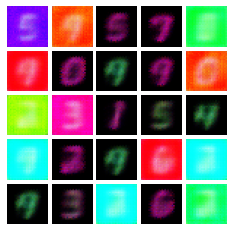

Reconstruction error is 0.03430, divergence exclusive is 0.00919, mutual information is 0.03733
Reconstruction error is 0.03506, divergence exclusive is 0.01297, mutual information is 0.03333
Reconstruction error is 0.03755, divergence exclusive is 0.00901, mutual information is 0.04539
Reconstruction error is 0.03252, divergence exclusive is 0.01108, mutual information is 0.03708
Reconstruction error is 0.03351, divergence exclusive is 0.00630, mutual information is 0.04078
epoch 3.0


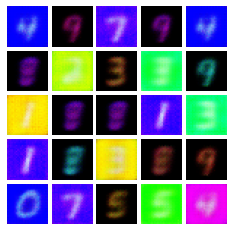

Reconstruction error is 0.03568, divergence exclusive is 0.00697, mutual information is 0.04100
Reconstruction error is 0.03622, divergence exclusive is 0.00562, mutual information is 0.04919
Reconstruction error is 0.03581, divergence exclusive is 0.00665, mutual information is 0.04399
Reconstruction error is 0.03464, divergence exclusive is 0.01841, mutual information is 0.04637
Reconstruction error is 0.03314, divergence exclusive is 0.00253, mutual information is 0.05240
epoch 4.0


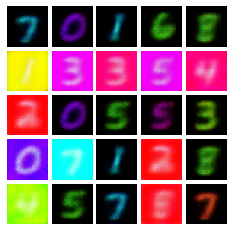

Reconstruction error is 0.03740, divergence exclusive is 0.00202, mutual information is 0.04489
Reconstruction error is 0.03225, divergence exclusive is 0.00702, mutual information is 0.04711
Reconstruction error is 0.03110, divergence exclusive is 0.00955, mutual information is 0.03154
Reconstruction error is 0.03095, divergence exclusive is 0.00944, mutual information is 0.04360
Reconstruction error is 0.03234, divergence exclusive is 0.01008, mutual information is 0.03978
epoch 5.0


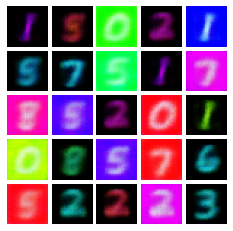

Reconstruction error is 0.03087, divergence exclusive is 0.01008, mutual information is 0.03308
Reconstruction error is 0.03185, divergence exclusive is 0.02573, mutual information is 0.04567
Reconstruction error is 0.03453, divergence exclusive is 0.01012, mutual information is 0.04225
Reconstruction error is 0.03387, divergence exclusive is 0.00314, mutual information is 0.04318
Reconstruction error is 0.03260, divergence exclusive is 0.00841, mutual information is 0.04141
epoch 6.0


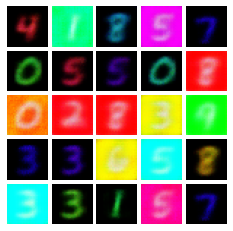

Reconstruction error is 0.03259, divergence exclusive is 0.01117, mutual information is 0.03891
Reconstruction error is 0.03272, divergence exclusive is 0.00888, mutual information is 0.04708
Reconstruction error is 0.02911, divergence exclusive is 0.00847, mutual information is 0.03021
Reconstruction error is 0.02865, divergence exclusive is 0.01325, mutual information is 0.03397
Reconstruction error is 0.03361, divergence exclusive is 0.00299, mutual information is 0.04873
epoch 7.0


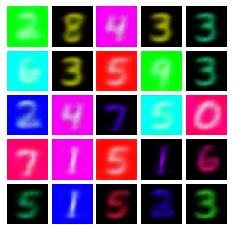

Reconstruction error is 0.03571, divergence exclusive is 0.01125, mutual information is 0.03726
Reconstruction error is 0.02928, divergence exclusive is 0.00665, mutual information is 0.04191
Reconstruction error is 0.03500, divergence exclusive is 0.01158, mutual information is 0.04438
Reconstruction error is 0.03376, divergence exclusive is 0.00663, mutual information is 0.03645
Reconstruction error is 0.03147, divergence exclusive is 0.00884, mutual information is 0.03724
epoch 8.0


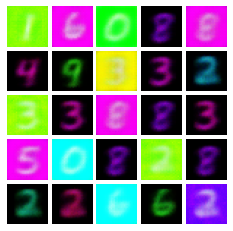

Reconstruction error is 0.03345, divergence exclusive is 0.00626, mutual information is 0.03938
Reconstruction error is 0.03283, divergence exclusive is 0.00398, mutual information is 0.03695
Reconstruction error is 0.02739, divergence exclusive is 0.01117, mutual information is 0.03505
Reconstruction error is 0.03173, divergence exclusive is 0.02030, mutual information is 0.02897
Reconstruction error is 0.03285, divergence exclusive is 0.01102, mutual information is 0.03820
epoch 9.0


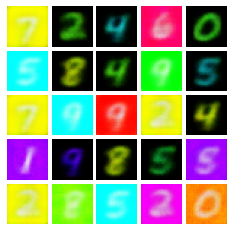

Reconstruction error is 0.03289, divergence exclusive is 0.03194, mutual information is 0.03931
Reconstruction error is 0.03358, divergence exclusive is 0.01206, mutual information is 0.03843
Reconstruction error is 0.03959, divergence exclusive is 0.00585, mutual information is 0.04656
Reconstruction error is 0.02962, divergence exclusive is 0.00546, mutual information is 0.04558
Reconstruction error is 0.03525, divergence exclusive is 0.00846, mutual information is 0.03679
epoch 10.0


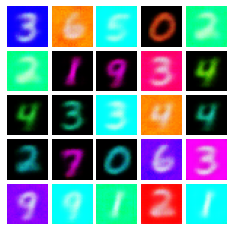

Reconstruction error is 0.03292, divergence exclusive is 0.01716, mutual information is 0.03426
Reconstruction error is 0.03503, divergence exclusive is 0.00357, mutual information is 0.04280
Reconstruction error is 0.03225, divergence exclusive is 0.02769, mutual information is 0.03355
Reconstruction error is 0.03399, divergence exclusive is 0.00431, mutual information is 0.03989
Reconstruction error is 0.02842, divergence exclusive is 0.01397, mutual information is 0.04958
epoch 11.0


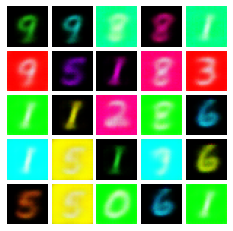

Reconstruction error is 0.03649, divergence exclusive is 0.01012, mutual information is 0.03948
Reconstruction error is 0.02919, divergence exclusive is 0.01744, mutual information is 0.04922
Reconstruction error is 0.03341, divergence exclusive is 0.01046, mutual information is 0.03778
Reconstruction error is 0.03433, divergence exclusive is 0.00313, mutual information is 0.04590
Reconstruction error is 0.03767, divergence exclusive is 0.00608, mutual information is 0.04579
epoch 12.0


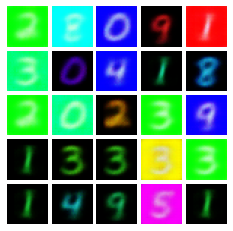

Reconstruction error is 0.03172, divergence exclusive is 0.01228, mutual information is 0.04590
Reconstruction error is 0.03486, divergence exclusive is 0.01096, mutual information is 0.03928
Reconstruction error is 0.03113, divergence exclusive is 0.00604, mutual information is 0.03442
Reconstruction error is 0.03109, divergence exclusive is 0.00820, mutual information is 0.03567
Reconstruction error is 0.03179, divergence exclusive is 0.00323, mutual information is 0.03931
epoch 13.0


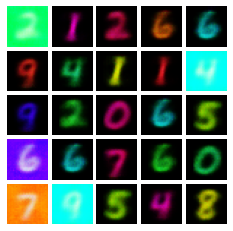

Reconstruction error is 0.03037, divergence exclusive is 0.00957, mutual information is 0.03643
Reconstruction error is 0.03603, divergence exclusive is 0.00803, mutual information is 0.03752
Reconstruction error is 0.03037, divergence exclusive is 0.01996, mutual information is 0.04699
Reconstruction error is 0.03118, divergence exclusive is 0.00462, mutual information is 0.04087
Reconstruction error is 0.02917, divergence exclusive is 0.00656, mutual information is 0.03583
epoch 14.0


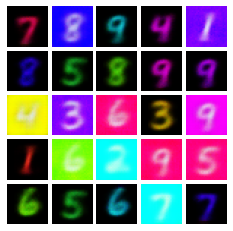

Reconstruction error is 0.03122, divergence exclusive is 0.00580, mutual information is 0.04203
Reconstruction error is 0.03359, divergence exclusive is 0.02888, mutual information is 0.03543
Reconstruction error is 0.03223, divergence exclusive is 0.01167, mutual information is 0.04504
Reconstruction error is 0.03293, divergence exclusive is 0.00638, mutual information is 0.04754
Reconstruction error is 0.03019, divergence exclusive is 0.00568, mutual information is 0.04120
epoch 15.0


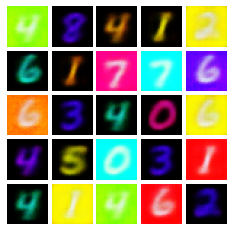

Reconstruction error is 0.03450, divergence exclusive is 0.00740, mutual information is 0.03920
Reconstruction error is 0.03392, divergence exclusive is 0.00636, mutual information is 0.03564
Reconstruction error is 0.03133, divergence exclusive is 0.01074, mutual information is 0.04874
Reconstruction error is 0.03238, divergence exclusive is 0.00756, mutual information is 0.04333
Reconstruction error is 0.02803, divergence exclusive is 0.00924, mutual information is 0.03948
epoch 17.0


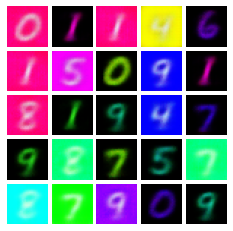

Reconstruction error is 0.03308, divergence exclusive is 0.01123, mutual information is 0.03581
Reconstruction error is 0.03018, divergence exclusive is 0.00633, mutual information is 0.03984
Reconstruction error is 0.02956, divergence exclusive is 0.00855, mutual information is 0.04271
Reconstruction error is 0.02826, divergence exclusive is 0.01140, mutual information is 0.03960
Reconstruction error is 0.03120, divergence exclusive is 0.03456, mutual information is 0.03317
epoch 18.0


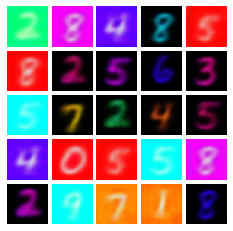

Reconstruction error is 0.03091, divergence exclusive is 0.01127, mutual information is 0.03969
Reconstruction error is 0.03489, divergence exclusive is 0.01274, mutual information is 0.03790
Reconstruction error is 0.03207, divergence exclusive is 0.01715, mutual information is 0.03435
Reconstruction error is 0.02795, divergence exclusive is 0.00753, mutual information is 0.03822
Reconstruction error is 0.02700, divergence exclusive is 0.00350, mutual information is 0.04196
epoch 19.0


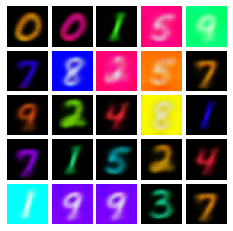

Reconstruction error is 0.03056, divergence exclusive is 0.00836, mutual information is 0.04454
Reconstruction error is 0.02526, divergence exclusive is 0.00237, mutual information is 0.04256
Reconstruction error is 0.03041, divergence exclusive is 0.00623, mutual information is 0.04043
Reconstruction error is 0.02897, divergence exclusive is 0.01090, mutual information is 0.04494
Reconstruction error is 0.03288, divergence exclusive is 0.00302, mutual information is 0.03774
epoch 20.0


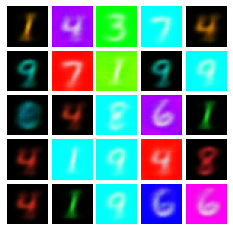

Reconstruction error is 0.03321, divergence exclusive is 0.00375, mutual information is 0.03659
Reconstruction error is 0.03179, divergence exclusive is 0.00905, mutual information is 0.03940
Reconstruction error is 0.02822, divergence exclusive is 0.01130, mutual information is 0.03655
Reconstruction error is 0.02795, divergence exclusive is 0.01198, mutual information is 0.03728
Reconstruction error is 0.03529, divergence exclusive is 0.01821, mutual information is 0.04375
epoch 21.0


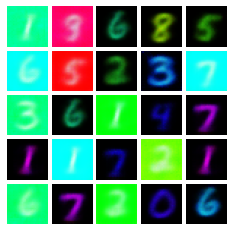

Reconstruction error is 0.03344, divergence exclusive is 0.00962, mutual information is 0.03468
Reconstruction error is 0.03353, divergence exclusive is 0.00472, mutual information is 0.05015
Reconstruction error is 0.02952, divergence exclusive is 0.00981, mutual information is 0.04713
Reconstruction error is 0.03150, divergence exclusive is 0.00538, mutual information is 0.03590
Reconstruction error is 0.03123, divergence exclusive is 0.00816, mutual information is 0.03706
epoch 22.0


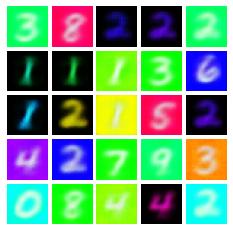

Reconstruction error is 0.03397, divergence exclusive is 0.01180, mutual information is 0.03253
Reconstruction error is 0.03078, divergence exclusive is 0.01570, mutual information is 0.04554
Reconstruction error is 0.02754, divergence exclusive is 0.00408, mutual information is 0.04264
Reconstruction error is 0.03096, divergence exclusive is 0.00973, mutual information is 0.04193
Reconstruction error is 0.03530, divergence exclusive is 0.00286, mutual information is 0.04556
epoch 23.0


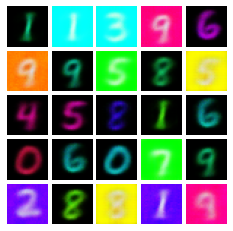

Reconstruction error is 0.02950, divergence exclusive is 0.01632, mutual information is 0.03662
Reconstruction error is 0.03047, divergence exclusive is 0.02177, mutual information is 0.05217
Reconstruction error is 0.03402, divergence exclusive is 0.00210, mutual information is 0.04573
Reconstruction error is 0.02801, divergence exclusive is 0.00719, mutual information is 0.04436
Reconstruction error is 0.03275, divergence exclusive is 0.00338, mutual information is 0.04324
epoch 24.0


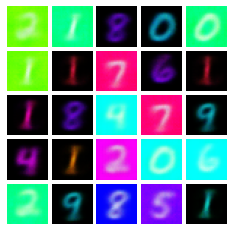

Reconstruction error is 0.03078, divergence exclusive is 0.00140, mutual information is 0.03584
Reconstruction error is 0.03170, divergence exclusive is 0.00638, mutual information is 0.03462
Reconstruction error is 0.03172, divergence exclusive is 0.00361, mutual information is 0.03616
Reconstruction error is 0.03116, divergence exclusive is 0.00273, mutual information is 0.05056
Reconstruction error is 0.03189, divergence exclusive is 0.00911, mutual information is 0.03585
epoch 25.0


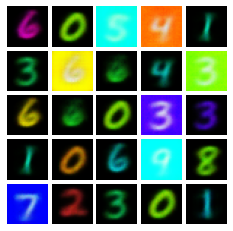

Reconstruction error is 0.03403, divergence exclusive is 0.00813, mutual information is 0.04283
Reconstruction error is 0.02991, divergence exclusive is 0.00676, mutual information is 0.03621
Reconstruction error is 0.03018, divergence exclusive is 0.00348, mutual information is 0.04079
Reconstruction error is 0.02774, divergence exclusive is 0.00427, mutual information is 0.04272
Reconstruction error is 0.03066, divergence exclusive is 0.00912, mutual information is 0.04723
epoch 26.0


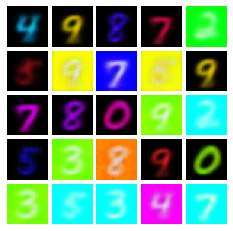

Reconstruction error is 0.02813, divergence exclusive is 0.01498, mutual information is 0.04323
Reconstruction error is 0.03344, divergence exclusive is 0.00502, mutual information is 0.04461
Reconstruction error is 0.03279, divergence exclusive is 0.00931, mutual information is 0.04212
Reconstruction error is 0.03038, divergence exclusive is 0.02423, mutual information is 0.03993
Reconstruction error is 0.02966, divergence exclusive is 0.01140, mutual information is 0.03454
epoch 27.0


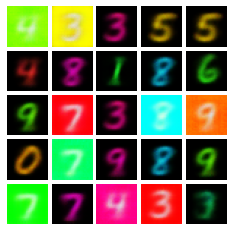

Reconstruction error is 0.02660, divergence exclusive is 0.01535, mutual information is 0.03200
Reconstruction error is 0.03316, divergence exclusive is 0.00774, mutual information is 0.04818
Reconstruction error is 0.03176, divergence exclusive is 0.00468, mutual information is 0.03338
Reconstruction error is 0.03346, divergence exclusive is 0.01099, mutual information is 0.04292
Reconstruction error is 0.03099, divergence exclusive is 0.00925, mutual information is 0.04110
epoch 28.0


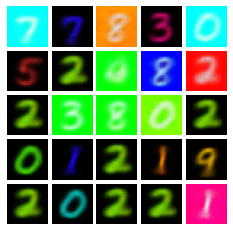

Reconstruction error is 0.03258, divergence exclusive is 0.00988, mutual information is 0.04810
Reconstruction error is 0.03233, divergence exclusive is 0.01863, mutual information is 0.05019
Reconstruction error is 0.02922, divergence exclusive is 0.01257, mutual information is 0.03466
Reconstruction error is 0.03254, divergence exclusive is 0.01583, mutual information is 0.03454
Reconstruction error is 0.03009, divergence exclusive is 0.00237, mutual information is 0.04120
epoch 29.0


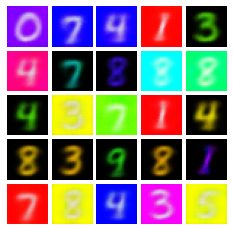

Reconstruction error is 0.02630, divergence exclusive is 0.02732, mutual information is 0.02361
Reconstruction error is 0.02942, divergence exclusive is 0.00685, mutual information is 0.04694
Reconstruction error is 0.03007, divergence exclusive is 0.01395, mutual information is 0.03805
Reconstruction error is 0.02879, divergence exclusive is 0.00549, mutual information is 0.04116
Reconstruction error is 0.03081, divergence exclusive is 0.01606, mutual information is 0.04267
epoch 30.0


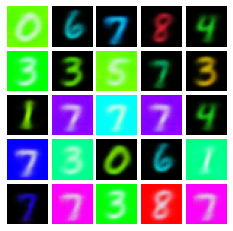

Reconstruction error is 0.03078, divergence exclusive is 0.00989, mutual information is 0.04992
Reconstruction error is 0.03121, divergence exclusive is 0.02587, mutual information is 0.04148
Reconstruction error is 0.02866, divergence exclusive is 0.00884, mutual information is 0.03405
Reconstruction error is 0.03158, divergence exclusive is 0.00549, mutual information is 0.03571
Reconstruction error is 0.02748, divergence exclusive is 0.01100, mutual information is 0.03249
epoch 31.0


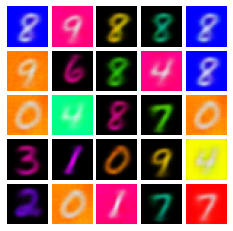

Reconstruction error is 0.02758, divergence exclusive is 0.00932, mutual information is 0.05175
Reconstruction error is 0.03058, divergence exclusive is 0.00920, mutual information is 0.04675
Reconstruction error is 0.02836, divergence exclusive is 0.00456, mutual information is 0.03623
Reconstruction error is 0.02786, divergence exclusive is 0.01381, mutual information is 0.03770
Reconstruction error is 0.02546, divergence exclusive is 0.02945, mutual information is 0.04186
epoch 33.0


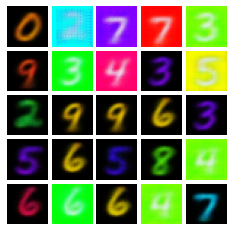

Reconstruction error is 0.03120, divergence exclusive is 0.01181, mutual information is 0.04858
Reconstruction error is 0.02668, divergence exclusive is 0.00975, mutual information is 0.03535
Reconstruction error is 0.03243, divergence exclusive is 0.01609, mutual information is 0.04942
Reconstruction error is 0.02662, divergence exclusive is 0.00540, mutual information is 0.03431
Reconstruction error is 0.02824, divergence exclusive is 0.00402, mutual information is 0.04821
epoch 34.0


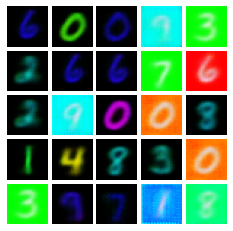

Reconstruction error is 0.02724, divergence exclusive is 0.01717, mutual information is 0.03277
Reconstruction error is 0.02591, divergence exclusive is 0.00685, mutual information is 0.03991
Reconstruction error is 0.02576, divergence exclusive is 0.00844, mutual information is 0.04083
Reconstruction error is 0.02509, divergence exclusive is 0.01193, mutual information is 0.03833
Reconstruction error is 0.02452, divergence exclusive is 0.01228, mutual information is 0.04750
epoch 35.0


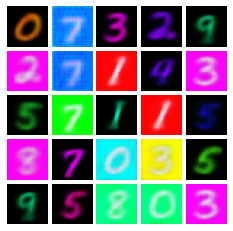

Reconstruction error is 0.02797, divergence exclusive is 0.01506, mutual information is 0.04223
Reconstruction error is 0.02682, divergence exclusive is 0.00706, mutual information is 0.03956
Reconstruction error is 0.02588, divergence exclusive is 0.00458, mutual information is 0.03780
Reconstruction error is 0.02546, divergence exclusive is 0.00752, mutual information is 0.03588
Reconstruction error is 0.02623, divergence exclusive is 0.01164, mutual information is 0.05564
epoch 36.0


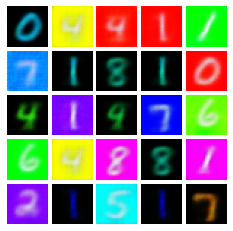

Reconstruction error is 0.02395, divergence exclusive is 0.01745, mutual information is 0.04208
Reconstruction error is 0.02845, divergence exclusive is 0.01044, mutual information is 0.04079
Reconstruction error is 0.02602, divergence exclusive is 0.02061, mutual information is 0.03977
Reconstruction error is 0.02703, divergence exclusive is 0.01109, mutual information is 0.04475
Reconstruction error is 0.02453, divergence exclusive is 0.00474, mutual information is 0.04515
epoch 37.0


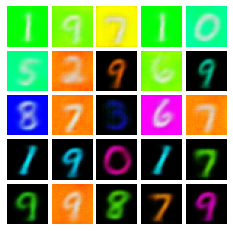

Reconstruction error is 0.02558, divergence exclusive is 0.00703, mutual information is 0.04938
Reconstruction error is 0.02538, divergence exclusive is 0.02276, mutual information is 0.03904
Reconstruction error is 0.02582, divergence exclusive is 0.01956, mutual information is 0.04441
Reconstruction error is 0.02654, divergence exclusive is 0.00374, mutual information is 0.03553
Reconstruction error is 0.02426, divergence exclusive is 0.00939, mutual information is 0.04839
epoch 38.0


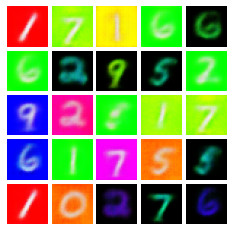

Reconstruction error is 0.02343, divergence exclusive is 0.00411, mutual information is 0.04204
Reconstruction error is 0.02692, divergence exclusive is 0.01079, mutual information is 0.03748
Reconstruction error is 0.02464, divergence exclusive is 0.00788, mutual information is 0.04201
Reconstruction error is 0.02561, divergence exclusive is 0.00907, mutual information is 0.04367
Reconstruction error is 0.02440, divergence exclusive is 0.02110, mutual information is 0.04210
epoch 39.0


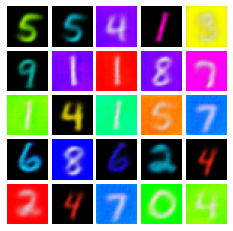

Reconstruction error is 0.02206, divergence exclusive is 0.01391, mutual information is 0.04771
Reconstruction error is 0.02085, divergence exclusive is 0.00761, mutual information is 0.03965
Reconstruction error is 0.02638, divergence exclusive is 0.01659, mutual information is 0.04928
Reconstruction error is 0.02277, divergence exclusive is 0.00885, mutual information is 0.03278
Reconstruction error is 0.02267, divergence exclusive is 0.01764, mutual information is 0.04242
epoch 40.0


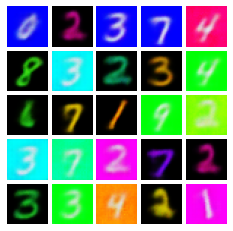

Reconstruction error is 0.02096, divergence exclusive is 0.01972, mutual information is 0.04181
Reconstruction error is 0.02086, divergence exclusive is 0.00894, mutual information is 0.06076
Reconstruction error is 0.02143, divergence exclusive is 0.01396, mutual information is 0.03424
Reconstruction error is 0.02289, divergence exclusive is 0.00937, mutual information is 0.05032
Reconstruction error is 0.02376, divergence exclusive is 0.01228, mutual information is 0.05478
epoch 41.0


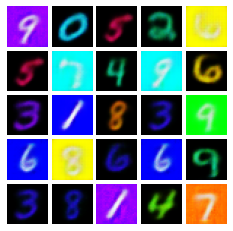

Reconstruction error is 0.02243, divergence exclusive is 0.00822, mutual information is 0.03609
Reconstruction error is 0.02158, divergence exclusive is 0.01452, mutual information is 0.03655
Reconstruction error is 0.02515, divergence exclusive is 0.02275, mutual information is 0.04790
Reconstruction error is 0.02085, divergence exclusive is 0.01395, mutual information is 0.05067
Reconstruction error is 0.02106, divergence exclusive is 0.01160, mutual information is 0.04385
epoch 42.0


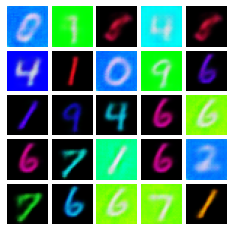

Reconstruction error is 0.02341, divergence exclusive is 0.01387, mutual information is 0.03298
Reconstruction error is 0.02345, divergence exclusive is 0.00929, mutual information is 0.05023
Reconstruction error is 0.02090, divergence exclusive is 0.00970, mutual information is 0.04551
Reconstruction error is 0.02029, divergence exclusive is 0.02722, mutual information is 0.05209
Reconstruction error is 0.02449, divergence exclusive is 0.00829, mutual information is 0.04644
epoch 43.0


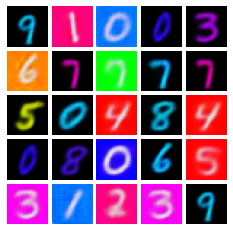

Reconstruction error is 0.02151, divergence exclusive is 0.00743, mutual information is 0.04795
Reconstruction error is 0.02082, divergence exclusive is 0.04414, mutual information is 0.04251
Reconstruction error is 0.02219, divergence exclusive is 0.01423, mutual information is 0.04566
Reconstruction error is 0.02215, divergence exclusive is 0.00610, mutual information is 0.04315
Reconstruction error is 0.02177, divergence exclusive is 0.01175, mutual information is 0.03747
epoch 44.0


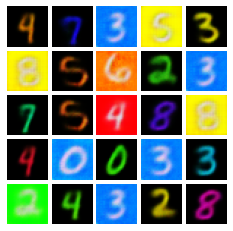

Reconstruction error is 0.03130, divergence exclusive is 0.01996, mutual information is 0.04281
Reconstruction error is 0.02053, divergence exclusive is 0.01305, mutual information is 0.03280
Reconstruction error is 0.02227, divergence exclusive is 0.02071, mutual information is 0.02787
Reconstruction error is 0.02378, divergence exclusive is 0.00998, mutual information is 0.03813
Reconstruction error is 0.02193, divergence exclusive is 0.00831, mutual information is 0.04218
epoch 45.0


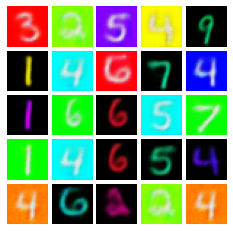

Reconstruction error is 0.02008, divergence exclusive is 0.02310, mutual information is 0.05134
Reconstruction error is 0.02091, divergence exclusive is 0.00965, mutual information is 0.04509
Reconstruction error is 0.02156, divergence exclusive is 0.00587, mutual information is 0.03726
Reconstruction error is 0.01845, divergence exclusive is 0.00411, mutual information is 0.04021
Reconstruction error is 0.02089, divergence exclusive is 0.00570, mutual information is 0.04121
epoch 46.0


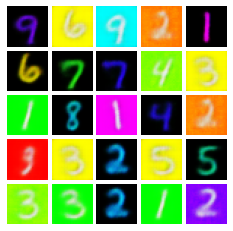

Reconstruction error is 0.02048, divergence exclusive is 0.01362, mutual information is 0.03959
Reconstruction error is 0.02236, divergence exclusive is 0.00737, mutual information is 0.05015
Reconstruction error is 0.02021, divergence exclusive is 0.01105, mutual information is 0.04064
Reconstruction error is 0.02037, divergence exclusive is 0.01254, mutual information is 0.04037
Reconstruction error is 0.01989, divergence exclusive is 0.00719, mutual information is 0.03129
epoch 47.0


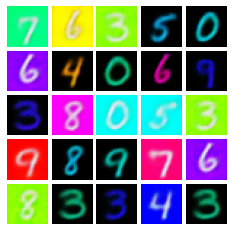

Reconstruction error is 0.01928, divergence exclusive is 0.02501, mutual information is 0.03816
Reconstruction error is 0.02036, divergence exclusive is 0.00653, mutual information is 0.04115
Reconstruction error is 0.02202, divergence exclusive is 0.01541, mutual information is 0.04397
Reconstruction error is 0.01870, divergence exclusive is 0.01356, mutual information is 0.03170
Reconstruction error is 0.01753, divergence exclusive is 0.00506, mutual information is 0.03102
epoch 49.0


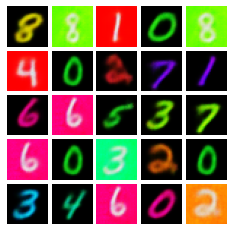

Reconstruction error is 0.02241, divergence exclusive is 0.00730, mutual information is 0.04424
Reconstruction error is 0.01875, divergence exclusive is 0.01235, mutual information is 0.04062
Reconstruction error is 0.01964, divergence exclusive is 0.01115, mutual information is 0.04079
Reconstruction error is 0.02042, divergence exclusive is 0.02226, mutual information is 0.04689
Reconstruction error is 0.01974, divergence exclusive is 0.00854, mutual information is 0.04975
epoch 50.0


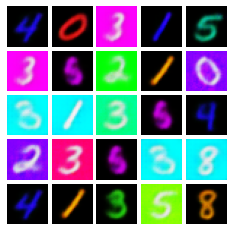

Reconstruction error is 0.02442, divergence exclusive is 0.01061, mutual information is 0.04164
Reconstruction error is 0.01898, divergence exclusive is 0.01008, mutual information is 0.03625
Reconstruction error is 0.02068, divergence exclusive is 0.00785, mutual information is 0.04415
Reconstruction error is 0.01989, divergence exclusive is 0.00413, mutual information is 0.04912
Reconstruction error is 0.02019, divergence exclusive is 0.01263, mutual information is 0.04063
epoch 51.0


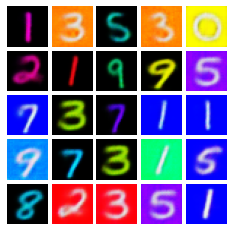

Reconstruction error is 0.02111, divergence exclusive is 0.01088, mutual information is 0.03673
Reconstruction error is 0.01841, divergence exclusive is 0.03023, mutual information is 0.04782
Reconstruction error is 0.01888, divergence exclusive is 0.01092, mutual information is 0.03353
Reconstruction error is 0.02035, divergence exclusive is 0.00558, mutual information is 0.04544
Reconstruction error is 0.02157, divergence exclusive is 0.01359, mutual information is 0.04410
epoch 52.0


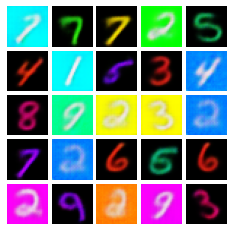

Reconstruction error is 0.02472, divergence exclusive is 0.00821, mutual information is 0.03700
Reconstruction error is 0.02027, divergence exclusive is 0.02053, mutual information is 0.03640
Reconstruction error is 0.01735, divergence exclusive is 0.01426, mutual information is 0.04105
Reconstruction error is 0.02052, divergence exclusive is 0.00773, mutual information is 0.03609
Reconstruction error is 0.01832, divergence exclusive is 0.00977, mutual information is 0.04500
epoch 53.0


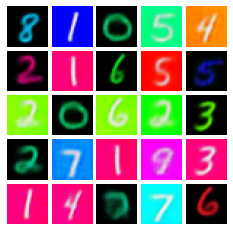

Reconstruction error is 0.01938, divergence exclusive is 0.00512, mutual information is 0.04345
Reconstruction error is 0.01738, divergence exclusive is 0.01514, mutual information is 0.03741
Reconstruction error is 0.02285, divergence exclusive is 0.00673, mutual information is 0.04164
Reconstruction error is 0.02165, divergence exclusive is 0.00918, mutual information is 0.04209
Reconstruction error is 0.01755, divergence exclusive is 0.01375, mutual information is 0.04470
epoch 54.0


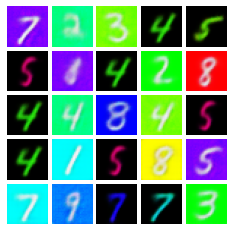

Reconstruction error is 0.01946, divergence exclusive is 0.01023, mutual information is 0.03448
Reconstruction error is 0.01863, divergence exclusive is 0.00343, mutual information is 0.04145
Reconstruction error is 0.01736, divergence exclusive is 0.01547, mutual information is 0.03844
Reconstruction error is 0.01840, divergence exclusive is 0.01921, mutual information is 0.03400
Reconstruction error is 0.01836, divergence exclusive is 0.00636, mutual information is 0.04543
epoch 55.0


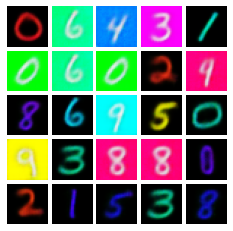

Reconstruction error is 0.01829, divergence exclusive is 0.00578, mutual information is 0.03155
Reconstruction error is 0.01859, divergence exclusive is 0.02054, mutual information is 0.04279
Reconstruction error is 0.02051, divergence exclusive is 0.01407, mutual information is 0.04543
Reconstruction error is 0.01866, divergence exclusive is 0.01214, mutual information is 0.03776
Reconstruction error is 0.01908, divergence exclusive is 0.01355, mutual information is 0.03954
epoch 56.0


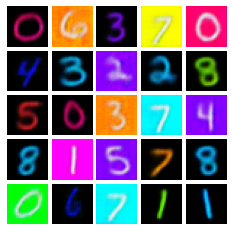

Reconstruction error is 0.01744, divergence exclusive is 0.01166, mutual information is 0.03825
Reconstruction error is 0.01935, divergence exclusive is 0.01935, mutual information is 0.04178
Reconstruction error is 0.01994, divergence exclusive is 0.00977, mutual information is 0.05001
Reconstruction error is 0.01958, divergence exclusive is 0.00683, mutual information is 0.04178
Reconstruction error is 0.01826, divergence exclusive is 0.00859, mutual information is 0.03752
epoch 57.0


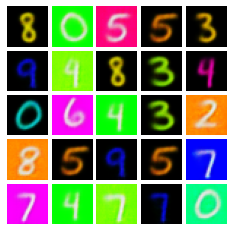

Reconstruction error is 0.01877, divergence exclusive is 0.01735, mutual information is 0.04200
Reconstruction error is 0.01945, divergence exclusive is 0.01036, mutual information is 0.04528
Reconstruction error is 0.02106, divergence exclusive is 0.01798, mutual information is 0.04953
Reconstruction error is 0.01999, divergence exclusive is 0.00560, mutual information is 0.04220
Reconstruction error is 0.01906, divergence exclusive is 0.00816, mutual information is 0.03764
epoch 58.0


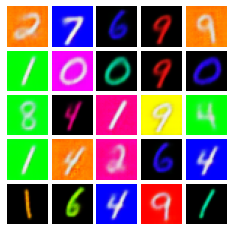

Reconstruction error is 0.01913, divergence exclusive is 0.00428, mutual information is 0.04637
Reconstruction error is 0.01894, divergence exclusive is 0.01198, mutual information is 0.03674
Reconstruction error is 0.01859, divergence exclusive is 0.00504, mutual information is 0.03567
Reconstruction error is 0.02043, divergence exclusive is 0.00337, mutual information is 0.04856
Reconstruction error is 0.01710, divergence exclusive is 0.01257, mutual information is 0.04168
epoch 59.0


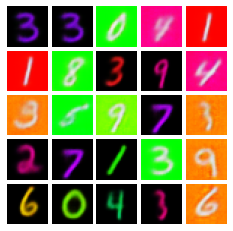

Reconstruction error is 0.02041, divergence exclusive is 0.00395, mutual information is 0.05819
Reconstruction error is 0.01660, divergence exclusive is 0.00781, mutual information is 0.04839
Reconstruction error is 0.01712, divergence exclusive is 0.02604, mutual information is 0.03834
Reconstruction error is 0.01831, divergence exclusive is 0.00456, mutual information is 0.04569
Reconstruction error is 0.01892, divergence exclusive is 0.00899, mutual information is 0.05168
epoch 60.0


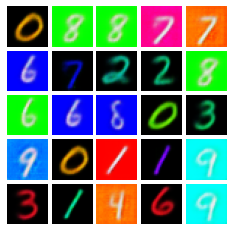

Reconstruction error is 0.01753, divergence exclusive is 0.01042, mutual information is 0.03690
Reconstruction error is 0.01800, divergence exclusive is 0.00723, mutual information is 0.04419
Reconstruction error is 0.01954, divergence exclusive is 0.01582, mutual information is 0.04091
Reconstruction error is 0.02117, divergence exclusive is 0.04184, mutual information is 0.03247
Reconstruction error is 0.01788, divergence exclusive is 0.01160, mutual information is 0.03858
epoch 61.0


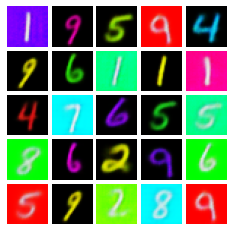

Reconstruction error is 0.01925, divergence exclusive is 0.01616, mutual information is 0.03596
Reconstruction error is 0.01783, divergence exclusive is 0.01904, mutual information is 0.03675
Reconstruction error is 0.01949, divergence exclusive is 0.03159, mutual information is 0.04303
Reconstruction error is 0.01657, divergence exclusive is 0.00777, mutual information is 0.04393
Reconstruction error is 0.01929, divergence exclusive is 0.02152, mutual information is 0.03796
epoch 62.0


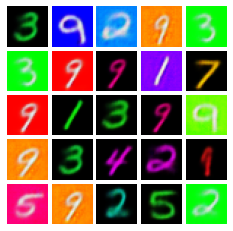

Reconstruction error is 0.01840, divergence exclusive is 0.00725, mutual information is 0.04741
Reconstruction error is 0.01530, divergence exclusive is 0.01009, mutual information is 0.04324
Reconstruction error is 0.01927, divergence exclusive is 0.00515, mutual information is 0.04831
Reconstruction error is 0.01777, divergence exclusive is 0.00811, mutual information is 0.03738
Reconstruction error is 0.01859, divergence exclusive is 0.00505, mutual information is 0.04878
epoch 63.0


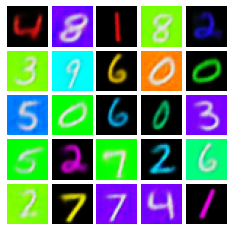

Reconstruction error is 0.01842, divergence exclusive is 0.00780, mutual information is 0.03492
Reconstruction error is 0.01823, divergence exclusive is 0.00384, mutual information is 0.04785
Reconstruction error is 0.01689, divergence exclusive is 0.02167, mutual information is 0.03442
Reconstruction error is 0.01965, divergence exclusive is 0.02343, mutual information is 0.05214
Reconstruction error is 0.01792, divergence exclusive is 0.00566, mutual information is 0.03037
epoch 65.0


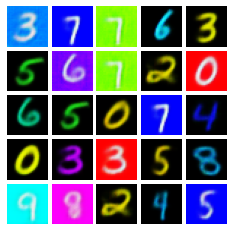

Reconstruction error is 0.01760, divergence exclusive is 0.01921, mutual information is 0.04662
Reconstruction error is 0.01601, divergence exclusive is 0.00347, mutual information is 0.04554
Reconstruction error is 0.01658, divergence exclusive is 0.00919, mutual information is 0.03519
Reconstruction error is 0.01583, divergence exclusive is 0.00436, mutual information is 0.04199
Reconstruction error is 0.01654, divergence exclusive is 0.00672, mutual information is 0.04416
epoch 66.0


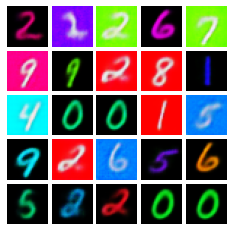

Reconstruction error is 0.01826, divergence exclusive is 0.00667, mutual information is 0.03760
Reconstruction error is 0.01581, divergence exclusive is 0.01674, mutual information is 0.04175
Reconstruction error is 0.01692, divergence exclusive is 0.00911, mutual information is 0.04158
Reconstruction error is 0.01535, divergence exclusive is 0.00318, mutual information is 0.03583
Reconstruction error is 0.01674, divergence exclusive is 0.00911, mutual information is 0.04232
epoch 67.0


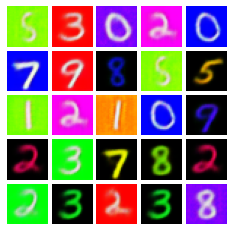

Reconstruction error is 0.01937, divergence exclusive is 0.00901, mutual information is 0.04212
Reconstruction error is 0.01720, divergence exclusive is 0.02070, mutual information is 0.04243
Reconstruction error is 0.01805, divergence exclusive is 0.00732, mutual information is 0.04170
Reconstruction error is 0.01832, divergence exclusive is 0.01413, mutual information is 0.03658
Reconstruction error is 0.01576, divergence exclusive is 0.00710, mutual information is 0.03801
epoch 68.0


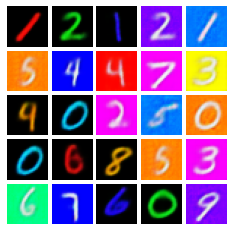

Reconstruction error is 0.01774, divergence exclusive is 0.00522, mutual information is 0.05231
Reconstruction error is 0.01886, divergence exclusive is 0.01060, mutual information is 0.04063
Reconstruction error is 0.01456, divergence exclusive is 0.00994, mutual information is 0.05164
Reconstruction error is 0.01644, divergence exclusive is 0.01770, mutual information is 0.04238
Reconstruction error is 0.01515, divergence exclusive is 0.00540, mutual information is 0.03970
epoch 69.0


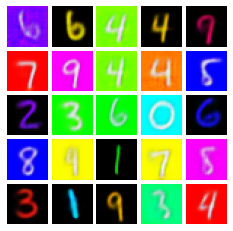

Reconstruction error is 0.01590, divergence exclusive is 0.00589, mutual information is 0.04601
Reconstruction error is 0.01650, divergence exclusive is 0.00642, mutual information is 0.03437
Reconstruction error is 0.01851, divergence exclusive is 0.00937, mutual information is 0.05147
Reconstruction error is 0.01437, divergence exclusive is 0.01689, mutual information is 0.04053
Reconstruction error is 0.01804, divergence exclusive is 0.00699, mutual information is 0.04030
epoch 70.0


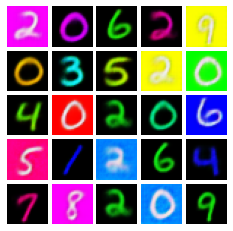

Reconstruction error is 0.01594, divergence exclusive is 0.00619, mutual information is 0.04799
Reconstruction error is 0.01580, divergence exclusive is 0.00448, mutual information is 0.04383
Reconstruction error is 0.01669, divergence exclusive is 0.01124, mutual information is 0.03765
Reconstruction error is 0.01834, divergence exclusive is 0.01988, mutual information is 0.04056
Reconstruction error is 0.01488, divergence exclusive is 0.00210, mutual information is 0.04057
epoch 71.0


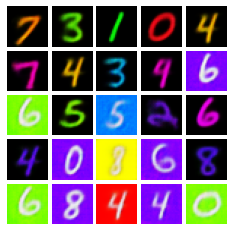

Reconstruction error is 0.01477, divergence exclusive is 0.00676, mutual information is 0.04044
Reconstruction error is 0.01588, divergence exclusive is 0.01040, mutual information is 0.04325
Reconstruction error is 0.01513, divergence exclusive is 0.01317, mutual information is 0.04559
Reconstruction error is 0.01671, divergence exclusive is 0.01936, mutual information is 0.03695
Reconstruction error is 0.01546, divergence exclusive is 0.01176, mutual information is 0.04715
epoch 72.0


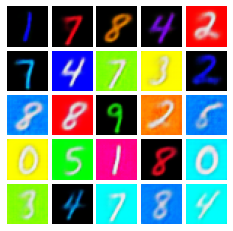

Reconstruction error is 0.01603, divergence exclusive is 0.00430, mutual information is 0.04574
Reconstruction error is 0.01469, divergence exclusive is 0.00431, mutual information is 0.04143
Reconstruction error is 0.01511, divergence exclusive is 0.00416, mutual information is 0.04337
Reconstruction error is 0.01494, divergence exclusive is 0.02075, mutual information is 0.04254
Reconstruction error is 0.01574, divergence exclusive is 0.00921, mutual information is 0.03735
epoch 73.0


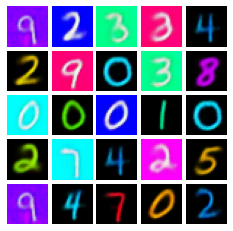

Reconstruction error is 0.01633, divergence exclusive is 0.01331, mutual information is 0.03883
Reconstruction error is 0.01830, divergence exclusive is 0.00542, mutual information is 0.05261
Reconstruction error is 0.01605, divergence exclusive is 0.01693, mutual information is 0.03561
Reconstruction error is 0.01520, divergence exclusive is 0.01948, mutual information is 0.04208
Reconstruction error is 0.02103, divergence exclusive is 0.00558, mutual information is 0.05063
epoch 74.0


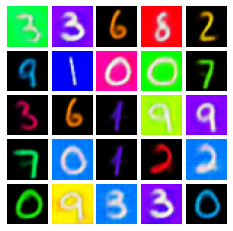

Reconstruction error is 0.01521, divergence exclusive is 0.00484, mutual information is 0.04668
Reconstruction error is 0.01252, divergence exclusive is 0.01157, mutual information is 0.03511
Reconstruction error is 0.01620, divergence exclusive is 0.00678, mutual information is 0.04990
Reconstruction error is 0.01519, divergence exclusive is 0.00671, mutual information is 0.04888
Reconstruction error is 0.01440, divergence exclusive is 0.00506, mutual information is 0.02811
epoch 75.0


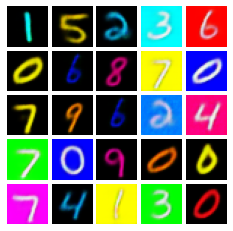

Reconstruction error is 0.01552, divergence exclusive is 0.00618, mutual information is 0.06625
Reconstruction error is 0.01572, divergence exclusive is 0.02621, mutual information is 0.04955
Reconstruction error is 0.01641, divergence exclusive is 0.00698, mutual information is 0.04457
Reconstruction error is 0.01595, divergence exclusive is 0.01523, mutual information is 0.04706
Reconstruction error is 0.01570, divergence exclusive is 0.00561, mutual information is 0.03889
epoch 76.0


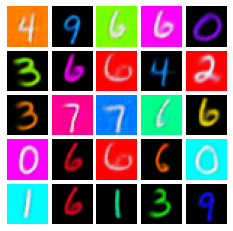

Reconstruction error is 0.01611, divergence exclusive is 0.00408, mutual information is 0.03874
Reconstruction error is 0.01531, divergence exclusive is 0.01162, mutual information is 0.04114
Reconstruction error is 0.01446, divergence exclusive is 0.00551, mutual information is 0.03690
Reconstruction error is 0.01554, divergence exclusive is 0.00581, mutual information is 0.05017
Reconstruction error is 0.01662, divergence exclusive is 0.01495, mutual information is 0.04235
epoch 77.0


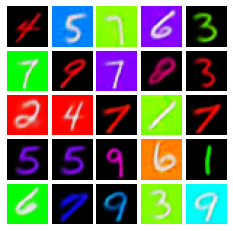

Reconstruction error is 0.01334, divergence exclusive is 0.01071, mutual information is 0.04699
Reconstruction error is 0.01649, divergence exclusive is 0.01937, mutual information is 0.05885
Reconstruction error is 0.01584, divergence exclusive is 0.00947, mutual information is 0.05197
Reconstruction error is 0.01452, divergence exclusive is 0.00798, mutual information is 0.04874
Reconstruction error is 0.01336, divergence exclusive is 0.00628, mutual information is 0.03953
epoch 78.0


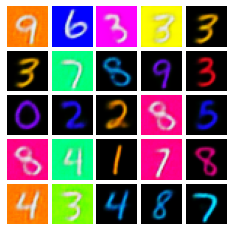

Reconstruction error is 0.01400, divergence exclusive is 0.00508, mutual information is 0.04527
Reconstruction error is 0.01513, divergence exclusive is 0.01245, mutual information is 0.04541
Reconstruction error is 0.01377, divergence exclusive is 0.01537, mutual information is 0.03755
Reconstruction error is 0.01314, divergence exclusive is 0.00395, mutual information is 0.05067
Reconstruction error is 0.01466, divergence exclusive is 0.01039, mutual information is 0.04270
epoch 79.0


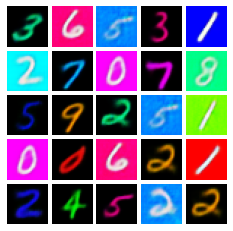

Reconstruction error is 0.02279, divergence exclusive is 0.00920, mutual information is 0.05421
Reconstruction error is 0.01596, divergence exclusive is 0.01234, mutual information is 0.04304
Reconstruction error is 0.01537, divergence exclusive is 0.01089, mutual information is 0.04427
Reconstruction error is 0.01515, divergence exclusive is 0.01277, mutual information is 0.04560
Reconstruction error is 0.01416, divergence exclusive is 0.00606, mutual information is 0.05072
epoch 81.0


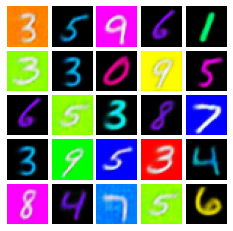

Reconstruction error is 0.01574, divergence exclusive is 0.02051, mutual information is 0.04117
Reconstruction error is 0.01531, divergence exclusive is 0.00914, mutual information is 0.04106
Reconstruction error is 0.01648, divergence exclusive is 0.00723, mutual information is 0.03626
Reconstruction error is 0.01226, divergence exclusive is 0.00790, mutual information is 0.04661
Reconstruction error is 0.01454, divergence exclusive is 0.00310, mutual information is 0.03418
epoch 82.0


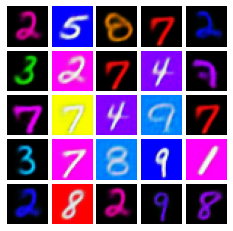

Reconstruction error is 0.01273, divergence exclusive is 0.00506, mutual information is 0.04072
Reconstruction error is 0.01775, divergence exclusive is 0.02369, mutual information is 0.04686
Reconstruction error is 0.01392, divergence exclusive is 0.00425, mutual information is 0.04109
Reconstruction error is 0.01414, divergence exclusive is 0.01048, mutual information is 0.05052
Reconstruction error is 0.01627, divergence exclusive is 0.01192, mutual information is 0.03974
epoch 83.0


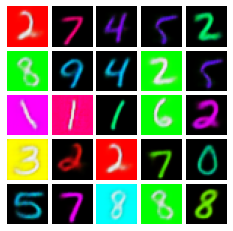

Reconstruction error is 0.01607, divergence exclusive is 0.01240, mutual information is 0.03846
Reconstruction error is 0.01224, divergence exclusive is 0.01358, mutual information is 0.03840
Reconstruction error is 0.01469, divergence exclusive is 0.00614, mutual information is 0.03603
Reconstruction error is 0.01449, divergence exclusive is 0.01462, mutual information is 0.04598
Reconstruction error is 0.01410, divergence exclusive is 0.01292, mutual information is 0.04232
epoch 84.0


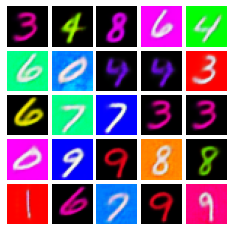

Reconstruction error is 0.01358, divergence exclusive is 0.00425, mutual information is 0.04820
Reconstruction error is 0.01394, divergence exclusive is 0.00799, mutual information is 0.05388
Reconstruction error is 0.01361, divergence exclusive is 0.00844, mutual information is 0.03488
Reconstruction error is 0.01403, divergence exclusive is 0.01016, mutual information is 0.05333
Reconstruction error is 0.01438, divergence exclusive is 0.01513, mutual information is 0.04701
epoch 85.0


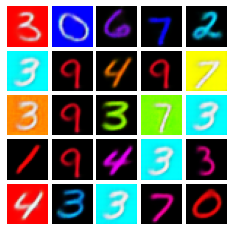

Reconstruction error is 0.01319, divergence exclusive is 0.00818, mutual information is 0.04709
Reconstruction error is 0.01431, divergence exclusive is 0.01002, mutual information is 0.04079
Reconstruction error is 0.01371, divergence exclusive is 0.01215, mutual information is 0.03901
Reconstruction error is 0.01741, divergence exclusive is 0.01987, mutual information is 0.05102
Reconstruction error is 0.01383, divergence exclusive is 0.00819, mutual information is 0.04738
epoch 86.0


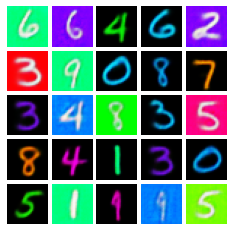

Reconstruction error is 0.01387, divergence exclusive is 0.01783, mutual information is 0.04189
Reconstruction error is 0.01515, divergence exclusive is 0.01253, mutual information is 0.03635
Reconstruction error is 0.01448, divergence exclusive is 0.02683, mutual information is 0.04504
Reconstruction error is 0.01575, divergence exclusive is 0.00774, mutual information is 0.04384
Reconstruction error is 0.01263, divergence exclusive is 0.01240, mutual information is 0.04116
epoch 87.0


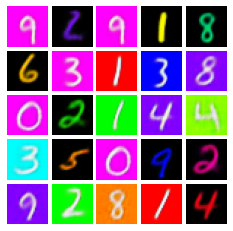

Reconstruction error is 0.01280, divergence exclusive is 0.01570, mutual information is 0.04493
Reconstruction error is 0.01242, divergence exclusive is 0.01299, mutual information is 0.04124
Reconstruction error is 0.01412, divergence exclusive is 0.02431, mutual information is 0.03193
Reconstruction error is 0.01233, divergence exclusive is 0.00357, mutual information is 0.04014
Reconstruction error is 0.01509, divergence exclusive is 0.00578, mutual information is 0.05490
epoch 88.0


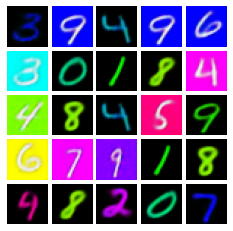

Reconstruction error is 0.01443, divergence exclusive is 0.00835, mutual information is 0.04250
Reconstruction error is 0.01305, divergence exclusive is 0.02166, mutual information is 0.03913
Reconstruction error is 0.01244, divergence exclusive is 0.00672, mutual information is 0.04744
Reconstruction error is 0.01362, divergence exclusive is 0.00609, mutual information is 0.04050
Reconstruction error is 0.01380, divergence exclusive is 0.00551, mutual information is 0.04326
epoch 89.0


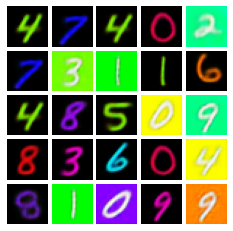

Reconstruction error is 0.01367, divergence exclusive is 0.00836, mutual information is 0.04533
Reconstruction error is 0.01398, divergence exclusive is 0.01634, mutual information is 0.03783
Reconstruction error is 0.01320, divergence exclusive is 0.00768, mutual information is 0.04522
Reconstruction error is 0.01100, divergence exclusive is 0.00646, mutual information is 0.03084
Reconstruction error is 0.01369, divergence exclusive is 0.00667, mutual information is 0.04490
epoch 90.0


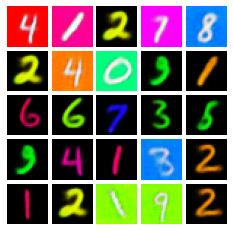

Reconstruction error is 0.01331, divergence exclusive is 0.00767, mutual information is 0.03442
Reconstruction error is 0.01250, divergence exclusive is 0.02406, mutual information is 0.04308
Reconstruction error is 0.01271, divergence exclusive is 0.00812, mutual information is 0.03053
Reconstruction error is 0.01385, divergence exclusive is 0.00980, mutual information is 0.04113
Reconstruction error is 0.01318, divergence exclusive is 0.00819, mutual information is 0.04611
epoch 91.0


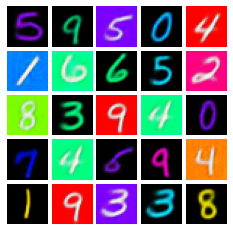

Reconstruction error is 0.01274, divergence exclusive is 0.00275, mutual information is 0.04572
Reconstruction error is 0.01237, divergence exclusive is 0.00337, mutual information is 0.03975
Reconstruction error is 0.01317, divergence exclusive is 0.00389, mutual information is 0.04834
Reconstruction error is 0.01411, divergence exclusive is 0.00995, mutual information is 0.03575
Reconstruction error is 0.01323, divergence exclusive is 0.00816, mutual information is 0.05317
epoch 92.0


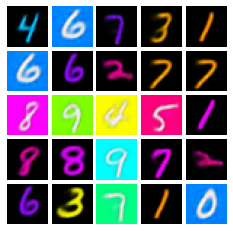

Reconstruction error is 0.01384, divergence exclusive is 0.00728, mutual information is 0.03101
Reconstruction error is 0.01455, divergence exclusive is 0.00513, mutual information is 0.04972
Reconstruction error is 0.01364, divergence exclusive is 0.02633, mutual information is 0.04182
Reconstruction error is 0.01408, divergence exclusive is 0.00853, mutual information is 0.04567
Reconstruction error is 0.01528, divergence exclusive is 0.01328, mutual information is 0.04023
epoch 93.0


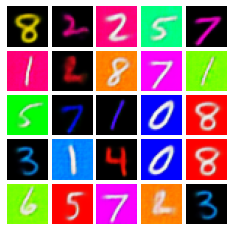

Reconstruction error is 0.01225, divergence exclusive is 0.00418, mutual information is 0.03674
Reconstruction error is 0.01390, divergence exclusive is 0.00406, mutual information is 0.03577
Reconstruction error is 0.01594, divergence exclusive is 0.01809, mutual information is 0.03492
Reconstruction error is 0.01337, divergence exclusive is 0.01034, mutual information is 0.04301
Reconstruction error is 0.01475, divergence exclusive is 0.00562, mutual information is 0.03927
epoch 94.0


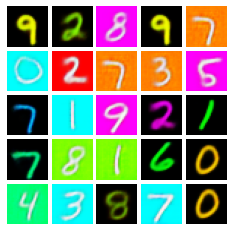

Reconstruction error is 0.01324, divergence exclusive is 0.00906, mutual information is 0.05065
Reconstruction error is 0.01450, divergence exclusive is 0.01201, mutual information is 0.04840
Reconstruction error is 0.02357, divergence exclusive is 0.01080, mutual information is 0.03585
Reconstruction error is 0.01314, divergence exclusive is 0.01037, mutual information is 0.04558
Reconstruction error is 0.01249, divergence exclusive is 0.02293, mutual information is 0.03734
epoch 95.0


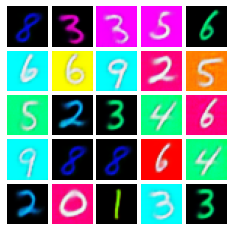

Reconstruction error is 0.01329, divergence exclusive is 0.00719, mutual information is 0.04929
Reconstruction error is 0.01431, divergence exclusive is 0.00481, mutual information is 0.03545
Reconstruction error is 0.01209, divergence exclusive is 0.01125, mutual information is 0.04416
Reconstruction error is 0.01382, divergence exclusive is 0.01578, mutual information is 0.04192
Reconstruction error is 0.01264, divergence exclusive is 0.01054, mutual information is 0.04576
epoch 97.0


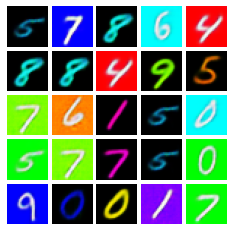

Reconstruction error is 0.01294, divergence exclusive is 0.00998, mutual information is 0.04875
Reconstruction error is 0.01411, divergence exclusive is 0.00682, mutual information is 0.04251
Reconstruction error is 0.01350, divergence exclusive is 0.00733, mutual information is 0.05337
Reconstruction error is 0.01283, divergence exclusive is 0.00725, mutual information is 0.06172
Reconstruction error is 0.01331, divergence exclusive is 0.00562, mutual information is 0.03641
epoch 98.0


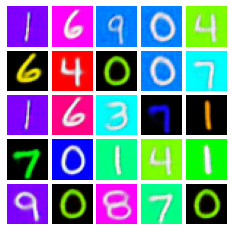

Reconstruction error is 0.01351, divergence exclusive is 0.00374, mutual information is 0.04102
Reconstruction error is 0.01383, divergence exclusive is 0.00901, mutual information is 0.03950
Reconstruction error is 0.01080, divergence exclusive is 0.01326, mutual information is 0.03166
Reconstruction error is 0.01156, divergence exclusive is 0.00566, mutual information is 0.03399
Reconstruction error is 0.01397, divergence exclusive is 0.01258, mutual information is 0.04350
epoch 99.0


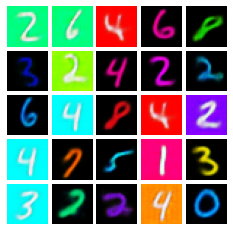

Reconstruction error is 0.01290, divergence exclusive is 0.00828, mutual information is 0.05098
Reconstruction error is 0.01334, divergence exclusive is 0.00461, mutual information is 0.03582
Reconstruction error is 0.01406, divergence exclusive is 0.00219, mutual information is 0.05873


In [24]:
batch_size = 64
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)
shared_dim = 10
latent_dim = 6 # to capture other latent factores as stroke, thickness, rotation etc. 
exclusive_dim = 2
n_epochs= 100

shared_dim = 10
PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewOnlyShared.pth'
path_ckpoint = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewExclusive'
device = torch.device('cpu')
sharedEncoder = BigOld_Convolutional_Encoder(latent_dim = shared_dim)
sharedEncoder.load_state_dict(torch.load(PATH, map_location = device))


encoder_exclusive, decoder = multiviewExclusive(train_loader,
    shared_encoder = sharedEncoder,
    latent_dim = latent_dim,
    exclusive_dim = exclusive_dim,
    shared_dim=shared_dim,
    batch_size = batch_size,
    n_epochs = n_epochs,
    print_every=200,
    plot_every = 1000,
    path_ckpoint =path_ckpoint )

PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewExclusive.pth'
torch.save(encoder_exclusive.state_dict(), PATH)
PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewExclusiveSharedDecoder.pth'
torch.save(decoder.state_dict(), PATH)

## Loading the learned models

In [11]:
shared_dim = 10
latent_dim = 6
exclusive_dim = 2
ex_dim = exclusive_dim + latent_dim
z_dim = ex_dim + shared_dim 

path_shared = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewOnlyShared.pth'
path_exclusive = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewExclusive.pth'
path_decoder = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/multiviewExclusiveSharedDecoder.pth'

device = torch.device('cpu')
shared_encoder = BigOld_Convolutional_Encoder(latent_dim = shared_dim)  
exclusive_encoder = BigOld_Convolutional_Encoder(latent_dim = ex_dim)
decoder = BigOld_Convolutional_Decoder(latent_dim = z_dim)

shared_encoder.load_state_dict(torch.load(path_shared, map_location = device))
exclusive_encoder.load_state_dict(torch.load(path_exclusive, map_location = device))
decoder.load_state_dict(torch.load(path_decoder, map_location = device))


<All keys matched successfully>

In [6]:
# device = torch.device('cuda:0')
loader = DataLoader(train_dataset, batch_size=1000)
sample = next(iter(loader))
view1 = sample.bg
view2 = sample.fg
label1 = sample.digit_label
label2 = sample.digit_label


x = torch.cat((view1, view2), 0)
# x = x.to('cuda:1')
z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
x_reconstructed = decoder(z)

### finding closest samples in the exclusive

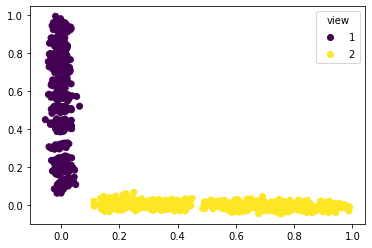

In [33]:
labelview1  = torch.ones(view1.shape[0])
labelview2  = 2*torch.ones(view1.shape[0])
labelview = torch.cat((labelview1,labelview2),0)
fig, ax = plt.subplots()
scatter = ax.scatter(z[:,10].cpu().detach().numpy(),z[:,11].cpu().detach().numpy(),c = labelview)
legend1 = ax.legend(*scatter.legend_elements(),  title="view",  bbox_to_anchor=(1, 1))
# path = './figures/' + 'viewExclusive.pdf'
# plt.savefig(path, dpi=600,bbox_inches='tight')


In [6]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
z_exclusive = z_exclusive.detach().numpy()
z_shared = z_shared.detach().numpy()
nbrs_exclusive = NearestNeighbors(n_neighbors=25, algorithm='ball_tree').fit(z_exclusive)
nbrs_shared = NearestNeighbors(n_neighbors=25, algorithm='ball_tree').fit(z_shared)

### Finding closest samples in the exclusive of a view 1 sample

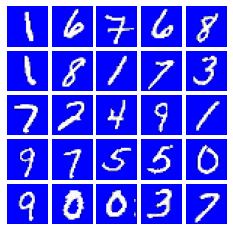

In [7]:
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[6,:].reshape(1, -1))
prototypes = x[indices[0,0:25],:].permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 5,5)

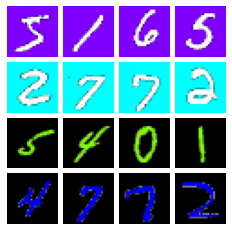

In [42]:
# z_exclusive = z_exclusive.detach().numpy()
nbrs_exclusive = NearestNeighbors(n_neighbors=4, algorithm='ball_tree').fit(z_exclusive)
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[0,:].reshape(1, -1))
prototypes = torch.zeros([16,3,28,28])
prototypes[:4,:] = x[indices[0,0:4],:]
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[25,:].reshape(1, -1))
prototypes[4:8,:] = x[indices[0,0:4],:]
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[1011,:].reshape(1, -1))
prototypes[8:12,:] = x[indices[0,0:4],:]
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[1009,:].reshape(1, -1))
prototypes[12:,:] = x[indices[0,0:4],:]
prototypes = prototypes.permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 4,4, save_fig = True, name = 'nnExclusive.pdf')

### Finding closest samples in the exclusive of a view 2 sample

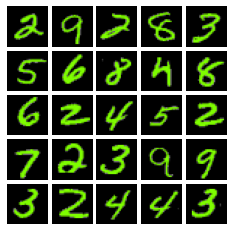

In [8]:
distances, indices = nbrs_exclusive.kneighbors(z_exclusive[1005,:].reshape(1, -1))
prototypes = x[indices[0,0:25],:].permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 5,5)

### Finding closest samples in the shared space of a view 1 sample

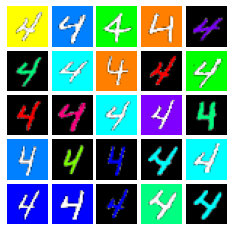

In [107]:
distances, indices = nbrs_shared.kneighbors(z_shared[9,:].reshape(1, -1))
prototypes = x[indices[0,0:25],:].permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 5,5)

### Finding closest samples in the shared space of a view 2 sample

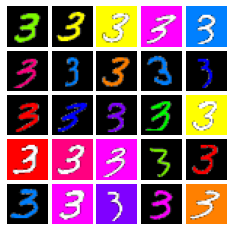

In [79]:
distances, indices = nbrs_shared.kneighbors(z_shared[1007,:].reshape(1, -1))
prototypes = x[indices[0,0:25],:].permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 5,5)

# Walking on the exclusive dimensions (view 1)

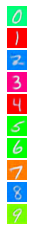

In [43]:
loader = DataLoader(train_dataset, batch_size=1000)
sample = next(iter(loader))
x = (sample.bg).clone().detach()
labels = sample.digit_label

z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
x_reconstructed = decoder(z)

prototypes = torch.zeros([10,3,28,28])
z_prototypes = torch.zeros(10,z.shape[1])
for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    prototypes[j,:,:,:] = x_reconstructed[label_class_idx[10],:,:,:]
    z_prototypes[j,:] = z[label_class_idx[10],:]

prototypes = prototypes.permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 10,1)



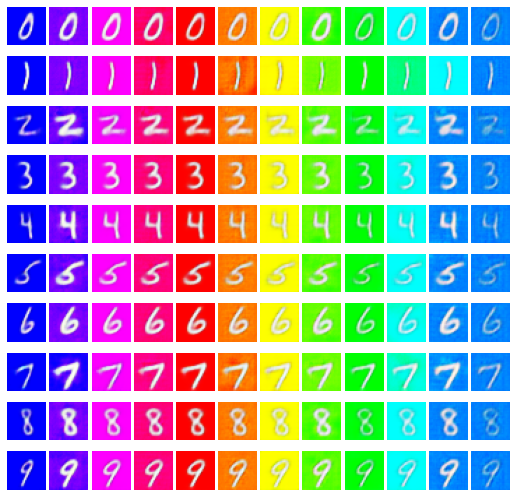

In [44]:
import matplotlib.gridspec as gridspec
def display_walkings(images,fig,outer, rows, cols):
    inner = gridspec.GridSpecFromSubplotSpec(rows, cols,subplot_spec=outer, wspace=0.1, hspace=0.1)   

    for idx, img in enumerate(images):  # images is a list
            ax = plt.Subplot(fig,inner[idx]) 
            ax.imshow(img)
            ax.set_axis_off()
            fig.add_subplot(ax)
    return fig

device = "cpu"

shared_dim = 10
exclusive_dim1 = 1
exclusive_dim2 = 1
n_steps = 12
n_digits = 10
walking = (torch.linspace(0.08,1.0,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(9, 9))

outer = gridspec.GridSpec(1, 1, wspace=0.2, hspace=0.2) # change to 2 if you have more exclusive dims

for i in range(exclusive_dim1):
    z_traversing[:,11] = walking
    x_traversing = decoder(z_traversing)
    x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
    fig = display_walkings(x_traversing,fig,outer[i], n_digits, n_steps)
fig.show() 


# Walking on the exclusive dimensions (view 2)

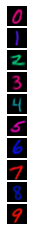

In [11]:
x = (sample.fg).clone().detach()
labels = sample.digit_label

z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
x_reconstructed = decoder(z)

prototypes = torch.zeros([10,3,28,28])
z_prototypes = torch.zeros(10,z.shape[1])
for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    prototypes[j,:,:,:] = x_reconstructed[label_class_idx[10],:,:,:]
    z_prototypes[j,:] = z[label_class_idx[10],:]

prototypes = prototypes.permute(0,2,3,1).contiguous().cpu().data.numpy()
display_mult_images(prototypes, 10,1)

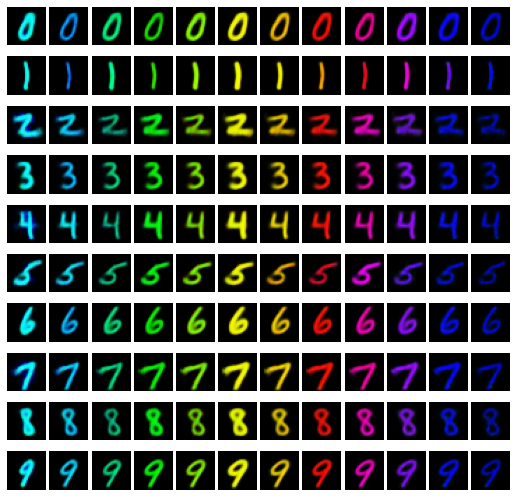

In [13]:
n_steps = 12
n_digits = 10
walking = (torch.linspace(0.1,1.0,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(9, 9))

outer = gridspec.GridSpec(1, 1, wspace=0.2, hspace=0.2) # change to 2 if you have more exclusive dims

for i in range(exclusive_dim1):
    # z_traversing[:,11] = walking
    z_traversing[:,10] = walking
    x_traversing = decoder(z_traversing)
    x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
    fig = display_walkings(x_traversing,fig,outer[i], n_digits, n_steps)
fig.show()  

### Image translation

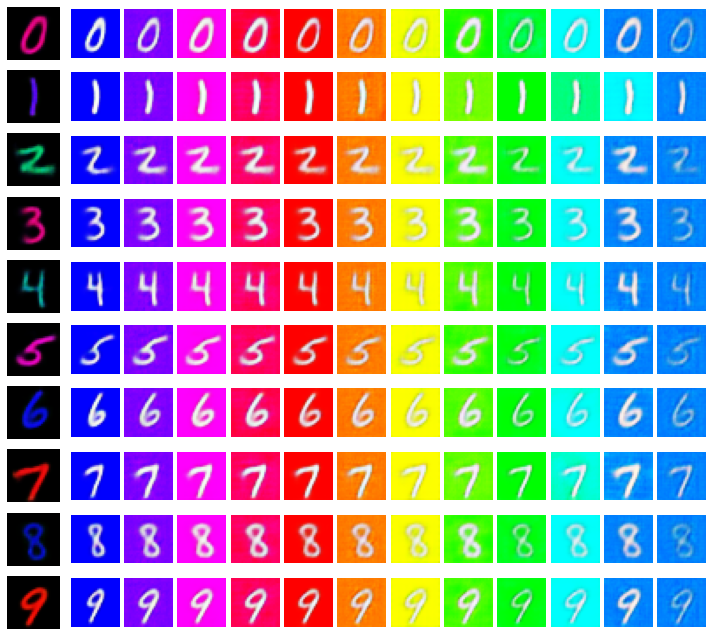

In [23]:
n_steps = 12
n_digits = 10
walking = (torch.linspace(0.1,1.0,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(10, 9))

outer = gridspec.GridSpec(1,2, wspace=0.0, hspace=0.0, width_ratios=[1,12]) # change to 2 if you have more exclusive dims
fig = display_walkings(prototypes,fig,outer[0], n_digits, 1)
for i in range(exclusive_dim1):
    z_traversing[:,11] = walking
    z_traversing[:,10] = 0
    x_traversing = decoder(z_traversing)
    x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
    fig = display_walkings(x_traversing,fig,outer[1], n_digits, n_steps)

outer.tight_layout(fig)
fig.show() 

## Style transfer

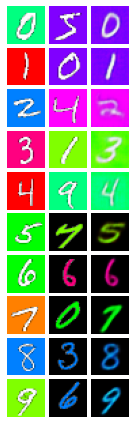

In [45]:
x = (sample.bg).clone().detach()
ref = (sample.fg).clone().detach()
ref = torch.cat((x[:5:,:,:,:],ref[-5:,:,:,:]),0) # combining refs from two views




query = torch.zeros([10,3,28,28])
labels = sample.digit_label

for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    query[j,:,:,:] = x[label_class_idx[10],:,:,:]

# queries
z_ex = exclusive_encoder(query)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(query)
z_query = torch.cat((z_shared,z_ex),1)

#references 
z_ex = exclusive_encoder(ref)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(ref)
z_ref = torch.cat((z_shared,z_ex),1)

# Transferring style by swapping exclusive dimensions
z_query[:,10:] = z_ref[:,10:] 
out = decoder(z_query)
out = out.permute(0,2,3,1).contiguous().cpu().data.numpy()
query = query.permute(0,2,3,1).contiguous().cpu().data.numpy()
ref = ref.permute(0,2,3,1).contiguous().cpu().data.numpy()

fig = plt.figure(figsize=(2, 6))
outer = gridspec.GridSpec(1,3, wspace=0.0, hspace=0.0, width_ratios=[1,1,1]) 
fig = display_walkings(query,fig,outer[0], 10, 1)
fig = display_walkings(ref,fig,outer[1], 10, 1)
fig = display_walkings(out,fig,outer[2], 10, 1)
outer.tight_layout(fig)
fig.show()
path = './figures/' + 'styleTransferV1.pdf'
plt.savefig(path, dpi=600,bbox_inches='tight')


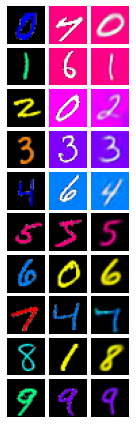

In [48]:
import matplotlib.gridspec as gridspec
def display_walkings(images,fig,outer, rows, cols):
    inner = gridspec.GridSpecFromSubplotSpec(rows, cols,subplot_spec=outer, wspace=0.1, hspace=0.1)   

    for idx, img in enumerate(images):  # images is a list
            ax = plt.Subplot(fig,inner[idx]) 
            ax.imshow(img)
            ax.set_axis_off()
            fig.add_subplot(ax)
    return fig

x = (sample.fg).clone().detach()
ref = (sample.bg).clone().detach()
ref = torch.cat((ref[-5:,:,:,:], x[:5:,:,:,:]),0) # combining refs from two views





query = torch.zeros([10,3,28,28])
labels = sample.digit_label

for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    query[j,:,:,:] = x[label_class_idx[10],:,:,:]

# queries
z_ex = exclusive_encoder(query)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(query)
z_query = torch.cat((z_shared,z_ex),1)

#references 
z_ex = exclusive_encoder(ref)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(ref)
z_ref = torch.cat((z_shared,z_ex),1)

# Transferring style by swapping exclusive dimensions
z_query[:,10:] = z_ref[:,10:] 
out = decoder(z_query)
out = out.permute(0,2,3,1).contiguous().cpu().data.numpy()
query = query.permute(0,2,3,1).contiguous().cpu().data.numpy()
ref = ref.permute(0,2,3,1).contiguous().cpu().data.numpy()

fig = plt.figure(figsize=(2, 6))
outer = gridspec.GridSpec(1,3, wspace=0.0, hspace=0.0, width_ratios=[1,1,1]) 
fig = display_walkings(query,fig,outer[0], 10, 1)
fig = display_walkings(ref,fig,outer[1], 10, 1)
fig = display_walkings(out,fig,outer[2], 10, 1)
outer.tight_layout(fig)
fig.show() 
path = './figures/' + 'styleTransferV2.pdf'
plt.savefig(path, dpi=600,bbox_inches='tight')


### Reconstructing with either the shared information or exclusive information

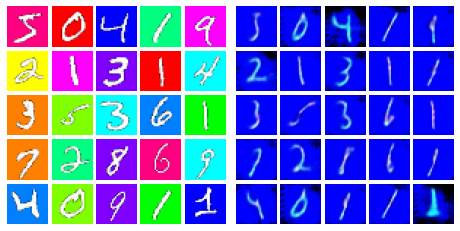

In [13]:
# device = torch.device('cuda:0')
loader = DataLoader(train_dataset, batch_size=25)
sample = next(iter(loader))
view1 = sample.bg
view2 = sample.fg
label1 = sample.digit_label
label2 = sample.digit_label


# x = torch.cat((view1, view2), 0)
x = view1
# x = x.to('cuda:1')
z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
z[:,11:12] = 0.03

x_reconstructed = decoder(z)
x_reconstructed = x_reconstructed.permute(0,2,3,1).contiguous().cpu().data.numpy()
x = x.permute(0,2,3,1).contiguous().cpu().data.numpy()

fig = plt.figure(figsize=(8, 4))
outer = gridspec.GridSpec(1,2, wspace=0.05, hspace=0.05, width_ratios=[1,1]) 
fig = display_walkings(x,fig,outer[0], 5, 5)
fig = display_walkings(x_reconstructed,fig,outer[1], 5, 5)

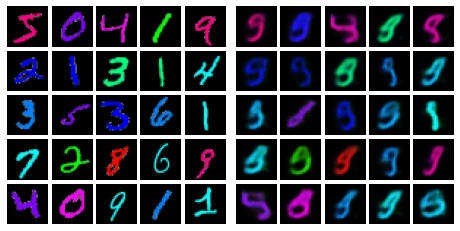

In [164]:
# device = torch.device('cuda:0')
loader = DataLoader(train_dataset, batch_size=25)
sample = next(iter(loader))
view1 = sample.bg
view2 = sample.fg
label1 = sample.digit_label
label2 = sample.digit_label


# x = torch.cat((view1, view2), 0)
x = view2
# x = x.to('cuda:1')
z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
z[:,:10] = 0.0

x_reconstructed = decoder(z)
x_reconstructed = x_reconstructed.permute(0,2,3,1).contiguous().cpu().data.numpy()
x = x.permute(0,2,3,1).contiguous().cpu().data.numpy()

fig = plt.figure(figsize=(8, 4))
outer = gridspec.GridSpec(1,2, wspace=0.05, hspace=0.05, width_ratios=[1,1]) 
fig = display_walkings(x,fig,outer[0], 5, 5)
fig = display_walkings(x_reconstructed,fig,outer[1], 5, 5)

### ICA walks

In [81]:
## getting prototypes to walk from
x = (sample.fg).clone().detach()
labels = sample.digit_label

z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
x_reconstructed = decoder(z)

prototypes = torch.zeros([10,3,28,28])
z_prototypes = torch.zeros(10,z.shape[1])
for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    prototypes[j,:,:,:] = x[label_class_idx[0],:,:,:]
    z_prototypes[j,:] = z[label_class_idx[0],:]

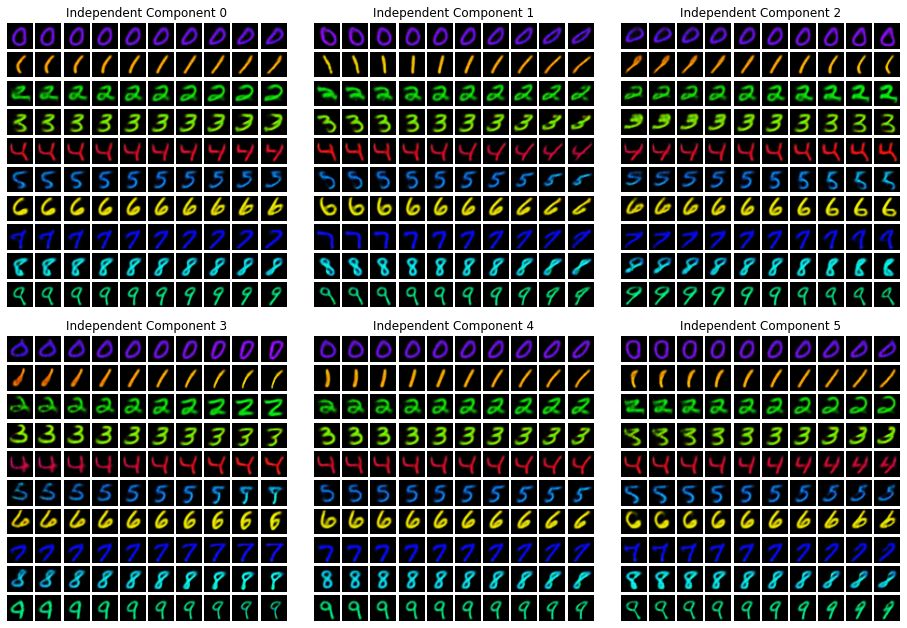

In [82]:
from sklearn.decomposition import fastica
n_steps = 10
n_digits = 10
rs = 22
walking = (torch.linspace(0.1,1.0,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(16, 11))

## getting Independent Components
z_latent = z_latent.detach()
K, W_inv, S, t = fastica(z_latent, whiten=False, return_n_iter=True, random_state=rs)
W_inv = torch.tensor(W_inv, requires_grad=False).double()
W = torch.linalg.inv(W_inv)


outer = gridspec.GridSpec(2,3, wspace=0.1, hspace=0.1) 

for i in range(latent_dim): 
    z_traversing_copy = z_traversing.clone()
    z_latent_prototypes = z_traversing_copy[:, -latent_dim:].double()
    # transform to IC space
    z_latent_comp = W @ z_latent_prototypes.T
    z_latent_whole = W @ z_latent.double().T ## to get the intervals
    walking = (torch.linspace(z_latent_whole[i,:].min()-0.02,z_latent_whole[i,:].max()+0.02,n_steps)).repeat(n_digits) 
    # walk on the ICA
    z_latent_comp[i,:] = walking 
    # transform back to mixed space
    z_latent_comp = W_inv @ z_latent_comp

    z_traversing_copy[:, -latent_dim:] = z_latent_comp.T
    x_traversing = decoder(z_traversing_copy)
    x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
    fig = display_mult_figures(x_traversing,fig,outer[i], n_digits, n_steps,'Independent Component ' + str(i))
fig.show()  
path = './figures/' + 'IndependentComponentsV2.pdf'
plt.savefig(path, dpi=200,bbox_inches='tight') 

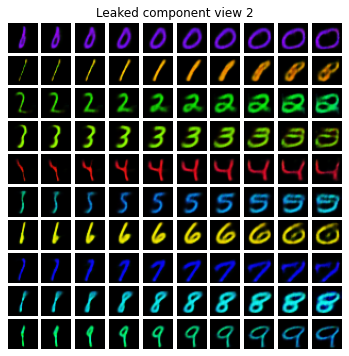

In [83]:
## other latent factors leaked in the view exclusive dimensions

n_steps = 10
n_digits = 10
walking = (torch.linspace(-0.08,0.08,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(6, 6))

outer = gridspec.GridSpec(1, 1, wspace=0.2, hspace=0.2) # change to 2 if you have more exclusive dims


z_traversing[:,11] = walking
x_traversing = decoder(z_traversing)
x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
fig = display_mult_figures(x_traversing,fig,outer[0], n_digits, n_steps, 'Leaked component view 2')
fig.show() 

path = './figures/' + 'LeakedComponentV2.pdf'
plt.savefig(path, dpi=200,bbox_inches='tight') 

### Same for view 1

In [76]:
x = (sample.bg).clone().detach()
labels = sample.digit_label

z_ex = exclusive_encoder(x)
z_exclusive = z_ex[:,:exclusive_dim]
z_latent = z_ex[:,-latent_dim:]
z_shared = shared_encoder(x)
z = torch.cat((z_shared,z_ex),1)
x_reconstructed = decoder(z)

prototypes = torch.zeros([10,3,28,28])
z_prototypes = torch.zeros(10,z.shape[1])
for j in range(10):
    label_class_idx = (labels==j).nonzero(as_tuple = True)[0]
    prototypes[j,:,:,:] = x_reconstructed[label_class_idx[10],:,:,:]
    z_prototypes[j,:] = z[label_class_idx[10],:]

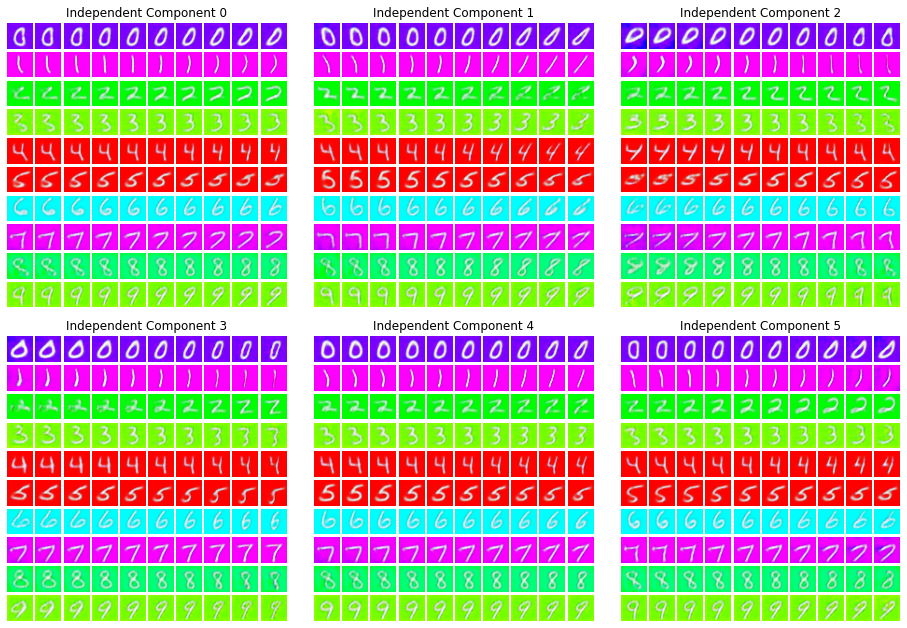

In [79]:
n_steps = 10
n_digits = 10
rs = 22
walking = (torch.linspace(0.1,1.0,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(16, 11))

## getting Independent Components
z_latent = z_latent.detach()
K, W_inv, S, t = fastica(z_latent, whiten=False, return_n_iter=True, random_state=rs)
W_inv = torch.tensor(W_inv, requires_grad=False).double()
W = torch.linalg.inv(W_inv)


outer = gridspec.GridSpec(2,3, wspace=0.1, hspace=0.1) 

for i in range(latent_dim): 
    z_traversing_copy = z_traversing.clone()
    z_latent_prototypes = z_traversing_copy[:, -latent_dim:].double()
    # transform to IC space
    z_latent_comp = W @ z_latent_prototypes.T
    z_latent_whole = W @ z_latent.double().T ## to get the intervals
    walking = (torch.linspace(z_latent_whole[i,:].min()-0.01,z_latent_whole[i,:].max()+0.01,n_steps)).repeat(n_digits) 
    # walk on the ICA
    z_latent_comp[i,:] = walking 
    # transform back to mixed space
    z_latent_comp = W_inv @ z_latent_comp

    z_traversing_copy[:, -latent_dim:] = z_latent_comp.T
    x_traversing = decoder(z_traversing_copy)
    x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
    fig = display_mult_figures(x_traversing,fig,outer[i], n_digits, n_steps,'Independent Component ' + str(i))
fig.show() 
# path = './figures/' + 'IndependentComponentsV1.pdf'
# plt.savefig(path, dpi=200,bbox_inches='tight') 

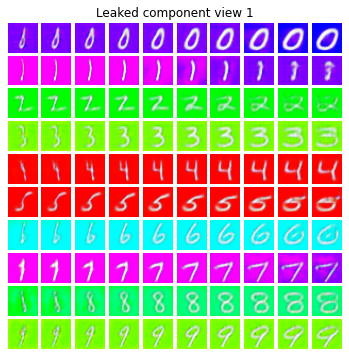

In [80]:
## other latent factors leaked in the view exclusive dimensions

n_steps = 10
n_digits = 10
walking = (torch.linspace(-0.06,0.06,n_steps)).repeat(n_digits)
# walking = (torch.linspace(-0.28,0.28,n_steps)).repeat(n_digits)
z_traversing = z_prototypes.repeat_interleave(n_steps,dim = 0)
fig = plt.figure(figsize=(6, 6))

outer = gridspec.GridSpec(1, 1, wspace=0.2, hspace=0.2) # change to 2 if you have more exclusive dims


z_traversing[:,10] = walking
x_traversing = decoder(z_traversing)
x_traversing = x_traversing.permute(0,2,3,1).contiguous().cpu().data.numpy()
fig = display_mult_figures(x_traversing,fig,outer[0], n_digits, n_steps,'Leaked component view 1')
fig.show() 

# path = './figures/' + 'LeakedComponentV1.pdf'
# plt.savefig(path, dpi=200,bbox_inches='tight') 

## Classifying digits with the learned shared features

In [99]:
batch_size = 64
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)
shared_dim = 10

n_epochs=10
use_cuda=True
print_every=200

classifier = digit_classifier(train_loader,
    encoder = shared_encoder,
    z_dim = shared_dim, 
    n_epochs=10,
    use_cuda=True,
)
PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/digit_classifier_shared.pth'
torch.save(classifier.state_dict(), PATH)

epoch 0.0 - Cross Entropy error is 0.01098
epoch 1.0 - Cross Entropy error is 0.00331
epoch 2.0 - Cross Entropy error is 0.00183
epoch 3.0 - Cross Entropy error is 0.00144
epoch 4.0 - Cross Entropy error is 0.00132
epoch 5.0 - Cross Entropy error is 0.00095
epoch 6.0 - Cross Entropy error is 0.00101
epoch 7.0 - Cross Entropy error is 0.00090
epoch 8.0 - Cross Entropy error is 0.00108
epoch 9.0 - Cross Entropy error is 0.00095


In [119]:
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_classifier(classifier = classifier,shared_encoder = shared_encoder,test_loader=test_loader)


Test set: Avg. loss: 0.0003, Accuracy: 19786/20000 (98.93%)



## Classifying digits with the learned exclusive features

In [5]:
batch_size = 64
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)
exclusive_dim = 2

n_epochs=10
use_cuda=True
print_every=200

classifier = digit_classifier(train_loader,
    encoder = exclusive_encoder,
    z_dim = exclusive_dim, 
    n_epochs=n_epochs,
    use_cuda=True,
)
PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/digit_classifier_exclusive.pth'
torch.save(classifier.state_dict(), PATH)

epoch 0.0 - Cross Entropy error is 2.30666
epoch 1.0 - Cross Entropy error is 2.29923
epoch 2.0 - Cross Entropy error is 2.29690
epoch 3.0 - Cross Entropy error is 2.30359
epoch 4.0 - Cross Entropy error is 2.29689
epoch 5.0 - Cross Entropy error is 2.29285
epoch 6.0 - Cross Entropy error is 2.30012
epoch 7.0 - Cross Entropy error is 2.29620
epoch 8.0 - Cross Entropy error is 2.29924
epoch 9.0 - Cross Entropy error is 2.29454


In [6]:
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_classifier(classifier = classifier,encoder = exclusive_encoder,test_loader=test_loader,z_dim = exclusive_dim)


Test set: Avg. loss: 0.0181, Accuracy: 2059/20000 (10.30%)



## Classifying background color with the view 1 exclusive feature

In [17]:
from trainer import color_classifier, test_color_classifier

batch_size = 128
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)

n_epochs=50
use_cuda=True

classifier = color_classifier(train_loader,
    encoder = exclusive_encoder,
    z_dim = 2, 
    n_epochs=n_epochs,
    use_cuda=True,
    type_color = 'bg')

PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/bg_color_classifier_exclusive.pth'
torch.save(classifier.state_dict(), PATH)

epoch 0.0 - Cross Entropy error is 0.90782
epoch 1.0 - Cross Entropy error is 0.60011
epoch 2.0 - Cross Entropy error is 0.47006
epoch 3.0 - Cross Entropy error is 0.37499
epoch 4.0 - Cross Entropy error is 0.32436
epoch 5.0 - Cross Entropy error is 0.18325
epoch 6.0 - Cross Entropy error is 0.18208
epoch 7.0 - Cross Entropy error is 0.15645
epoch 8.0 - Cross Entropy error is 0.16059
epoch 9.0 - Cross Entropy error is 0.14762
epoch 10.0 - Cross Entropy error is 0.09657
epoch 11.0 - Cross Entropy error is 0.13433
epoch 12.0 - Cross Entropy error is 0.09290
epoch 13.0 - Cross Entropy error is 0.06200
epoch 14.0 - Cross Entropy error is 0.06654
epoch 15.0 - Cross Entropy error is 0.08272
epoch 16.0 - Cross Entropy error is 0.04386
epoch 17.0 - Cross Entropy error is 0.06803
epoch 18.0 - Cross Entropy error is 0.04550
epoch 19.0 - Cross Entropy error is 0.06652
epoch 20.0 - Cross Entropy error is 0.05641
epoch 21.0 - Cross Entropy error is 0.06178
epoch 22.0 - Cross Entropy error is 0.0529

In [25]:
from models import Simple_Classifier
from trainer import test_color_classifier
device = torch.device('cuda:1')
path_classifier =  r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/bg_color_classifier_exclusive.pth'
classifier = Simple_Classifier(latent_dim = exclusive_dim , num_classes=12)
classifier.load_state_dict(torch.load(path_classifier, map_location = device))
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_color_classifier(classifier = classifier,encoder = exclusive_encoder,test_loader=test_loader,z_dim = exclusive_dim,type_color = 'bg')


Test set: Avg. loss: 0.0002, Accuracy: 9884/10000 (98.84%)



## Classifying foreground color with the view 2 exclusive feature

In [27]:
from trainer import color_classifier

batch_size = 32
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)

n_epochs=50
use_cuda=True

classifier = color_classifier(train_loader,
    encoder = exclusive_encoder,
    z_dim = 2, 
    n_epochs=n_epochs,
    use_cuda=True,
    type_color = 'fg')

PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/fg_color_classifier_exclusive.pth'
torch.save(classifier.state_dict(), PATH)

epoch 0.0 - Cross Entropy error is 0.73638
epoch 1.0 - Cross Entropy error is 0.59445
epoch 2.0 - Cross Entropy error is 0.48206
epoch 3.0 - Cross Entropy error is 0.55716
epoch 4.0 - Cross Entropy error is 0.51960
epoch 5.0 - Cross Entropy error is 0.50841
epoch 6.0 - Cross Entropy error is 0.51772
epoch 7.0 - Cross Entropy error is 0.67590
epoch 8.0 - Cross Entropy error is 0.66286
epoch 9.0 - Cross Entropy error is 0.48918
epoch 10.0 - Cross Entropy error is 0.40141
epoch 11.0 - Cross Entropy error is 0.65902
epoch 12.0 - Cross Entropy error is 0.51444
epoch 13.0 - Cross Entropy error is 0.39250
epoch 14.0 - Cross Entropy error is 0.50567
epoch 15.0 - Cross Entropy error is 0.55678
epoch 16.0 - Cross Entropy error is 0.44607
epoch 17.0 - Cross Entropy error is 0.59117
epoch 18.0 - Cross Entropy error is 0.38525
epoch 19.0 - Cross Entropy error is 0.65773
epoch 20.0 - Cross Entropy error is 0.48425
epoch 21.0 - Cross Entropy error is 0.55631
epoch 22.0 - Cross Entropy error is 0.3419

In [28]:
# from models import Simple_Classifier
# from trainer import test_color_classifier
# device = torch.device('cuda:1')
# path_classifier =  r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/bg_color_classifier_exclusive.pth'
# classifier = Simple_Classifier(latent_dim = exclusive_dim , num_classes=12)
# classifier.load_state_dict(torch.load(path_classifier, map_location = device))
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_color_classifier(classifier = classifier,encoder = exclusive_encoder,test_loader=test_loader,z_dim = exclusive_dim,type_color = 'fg')


Test set: Avg. loss: 0.0139, Accuracy: 8430/10000 (84.30%)



## Classifying background color with the shared features

In [29]:
from trainer import color_classifier, test_color_classifier

batch_size = 128
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)

n_epochs=10
use_cuda=True

classifier = color_classifier(train_loader,
    encoder = shared_encoder,
    z_dim = 10, 
    n_epochs=n_epochs,
    use_cuda=True,
    type_color = 'bg')

# PATH = r'/home/name/Disentanglement learning/multiviewColoredMnist/saved_models/bg_color_classifier_exclusive.pth'
# torch.save(classifier.state_dict(), PATH)

epoch 0.0 - Cross Entropy error is 2.60210
epoch 1.0 - Cross Entropy error is 2.53209
epoch 2.0 - Cross Entropy error is 2.53876
epoch 3.0 - Cross Entropy error is 2.48656
epoch 4.0 - Cross Entropy error is 2.48657
epoch 5.0 - Cross Entropy error is 2.48103
epoch 6.0 - Cross Entropy error is 2.47899
epoch 7.0 - Cross Entropy error is 2.50067
epoch 8.0 - Cross Entropy error is 2.49483
epoch 9.0 - Cross Entropy error is 2.48476


In [31]:
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_color_classifier(classifier = classifier,encoder = shared_encoder,test_loader=test_loader,z_dim = 10,type_color = 'bg')


Test set: Avg. loss: 0.0196, Accuracy: 879/10000 (8.79%)



## Classifying foreground color with the shared features

In [32]:
from trainer import color_classifier, test_color_classifier

batch_size = 128
train_dataset = ColoredMNISTDataset(train=True, data_folder='./data/coloredMNIST')
train_loader = DataLoader(train_dataset, batch_size=batch_size)

n_epochs=10
use_cuda=True

classifier = color_classifier(train_loader,
    encoder = shared_encoder,
    z_dim = 10, 
    n_epochs=n_epochs,
    use_cuda=True,
    type_color = 'fg')

epoch 0.0 - Cross Entropy error is 2.55515
epoch 1.0 - Cross Entropy error is 2.45287
epoch 2.0 - Cross Entropy error is 2.48321
epoch 3.0 - Cross Entropy error is 2.51673
epoch 4.0 - Cross Entropy error is 2.50104
epoch 5.0 - Cross Entropy error is 2.46960
epoch 6.0 - Cross Entropy error is 2.48781
epoch 7.0 - Cross Entropy error is 2.47222
epoch 8.0 - Cross Entropy error is 2.48194
epoch 9.0 - Cross Entropy error is 2.48046


In [33]:
test_dataset = ColoredMNISTDataset(train=False, data_folder='./data/coloredMNIST')
test_loader = DataLoader(test_dataset, batch_size=batch_size)
test_color_classifier(classifier = classifier,encoder = shared_encoder,test_loader=test_loader,z_dim = 10,type_color = 'fg')


Test set: Avg. loss: 0.0196, Accuracy: 841/10000 (8.41%)

